In [342]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings # supress warnings
warnings.filterwarnings('ignore')



In [343]:
df = pd.read_csv("Skyserver_SQL2_27_2018 6_51_39 PM.csv")

In [344]:
df.head(3)

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1.237650e+18,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,301,4,267,3.722360e+18,STAR,-0.000009,3306,54922,491
1,1.237650e+18,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,301,4,267,3.638140e+17,STAR,-0.000055,323,51615,541
2,1.237650e+18,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,301,4,268,3.232740e+17,GALAXY,0.123111,287,52023,513


The data consists of 10,000 observations of space taken by the SDSS (Sloan Digital Sky Survey). Every observation is described by 17 feature columns and 1 class column which identifies it to be either a star, galaxy or quasar.

Let's see the features:

We have 2 kind of data, 'PhotoObj' about photometric data and 'SpecObj' about spectral data. 

* 'objid' is the Object Identifier.

* 'ra' and 'dec' are J2000 Right Ascension (r-band) and J2000 Declination (r-band). Their coordinates.

*  'u', 'g', 'r', 'i', 'z' are the better of DeV/Exp magnitude fit. The Thuan-Gunn astronomic magnitude system. u, g, r, i, z represent the response of the 5 bands of the telescope. Is information about magnitude (brightness) of the objets in each wavelength.

Run, rerun, camcol and field are features which describe a field within an image taken by the SDSS. A field is basically a part of the entire image corresponding to 2048 by 1489 pixels. A field can be identified by:

* 'run' is which identifies the specific scan.

* 'rerun' specifies how the image was processed.

* 'camcol' is a number from 1 to 6, identifying the scanline within the run.

* 'field' The field number typically starts at 11 (after an initial rampup time), and can be as large as 800 for particularly long runs

Now let's see 'SpecObj'.

* 'specobjid' is an Object Identifier.

* 'class' is the object class (galaxy, star or quasar object).

* 'redshift' In physics, redshift happens when light or other electromagnetic radiation from an object is increased in wavelength, or shifted to the red end of the spectrum.

* 'plate' = plate number.

* 'mjd' is MJD (Modified Julian Dates) of observation. The date of the observation.

* 'fiberid' is fiber ID.

# Exploratory Analysis

In [345]:
df.describe()

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,redshift,plate,mjd,fiberid
count,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.0,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000
mean,1.237650e+18,175.529987,14.836148,18.619355,17.371931,16.840963,16.583579,16.422833,981.034800,301.0,3.648700,302.380100,1.645022e+18,0.143726,1460.986400,52943.533300,353.069400
std,1.577039e+05,47.783439,25.212207,0.828656,0.945457,1.067764,1.141805,1.203188,273.305024,0.0,1.666183,162.577763,2.013998e+18,0.388774,1788.778371,1511.150651,206.298149
min,1.237650e+18,8.235100,-5.382632,12.988970,12.799550,12.431600,11.947210,11.610410,308.000000,301.0,1.000000,11.000000,2.995780e+17,-0.004136,266.000000,51578.000000,1.000000
25%,1.237650e+18,157.370946,-0.539035,18.178035,16.815100,16.173333,15.853705,15.618285,752.000000,301.0,2.000000,184.000000,3.389248e+17,0.000081,301.000000,51900.000000,186.750000
50%,1.237650e+18,180.394514,0.404166,18.853095,17.495135,16.858770,16.554985,16.389945,756.000000,301.0,4.000000,299.000000,4.966580e+17,0.042591,441.000000,51997.000000,351.000000
75%,1.237650e+18,201.547279,35.649397,19.259232,18.010145,17.512675,17.258550,17.141447,1331.000000,301.0,5.000000,414.000000,2.881300e+18,0.092579,2559.000000,54468.000000,510.000000
max,1.237650e+18,260.884382,68.542265,19.599900,19.918970,24.802040,28.179630,22.833060,1412.000000,301.0,6.000000,768.000000,9.468830e+18,5.353854,8410.000000,57481.000000,1000.000000


In [346]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 18 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   objid      10000 non-null  float64
 1   ra         10000 non-null  float64
 2   dec        10000 non-null  float64
 3   u          10000 non-null  float64
 4   g          10000 non-null  float64
 5   r          10000 non-null  float64
 6   i          10000 non-null  float64
 7   z          10000 non-null  float64
 8   run        10000 non-null  int64  
 9   rerun      10000 non-null  int64  
 10  camcol     10000 non-null  int64  
 11  field      10000 non-null  int64  
 12  specobjid  10000 non-null  float64
 13  class      10000 non-null  object 
 14  redshift   10000 non-null  float64
 15  plate      10000 non-null  int64  
 16  mjd        10000 non-null  int64  
 17  fiberid    10000 non-null  int64  
dtypes: float64(10), int64(7), object(1)
memory usage: 1.4+ MB


We can see that none of the entries are NaN, so cleaning is not necessary.

In [347]:
df.nunique().to_frame().transpose() 

,objid,ra,dec,u,g,r,i,z,run,rerun,camcol,field,specobjid,class,redshift,plate,mjd,fiberid
0,1,10000,10000,9730,9817,9852,9890,9896,23,1,6,703,6349,3,9637,487,355,892


In [348]:
occurrences = df['class'].value_counts().to_frame().rename(index=str, columns={'class': 'Occurrences'})
occurrences

,Occurrences
GALAXY,4998
STAR,4152
QSO,850


# Some Plots

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


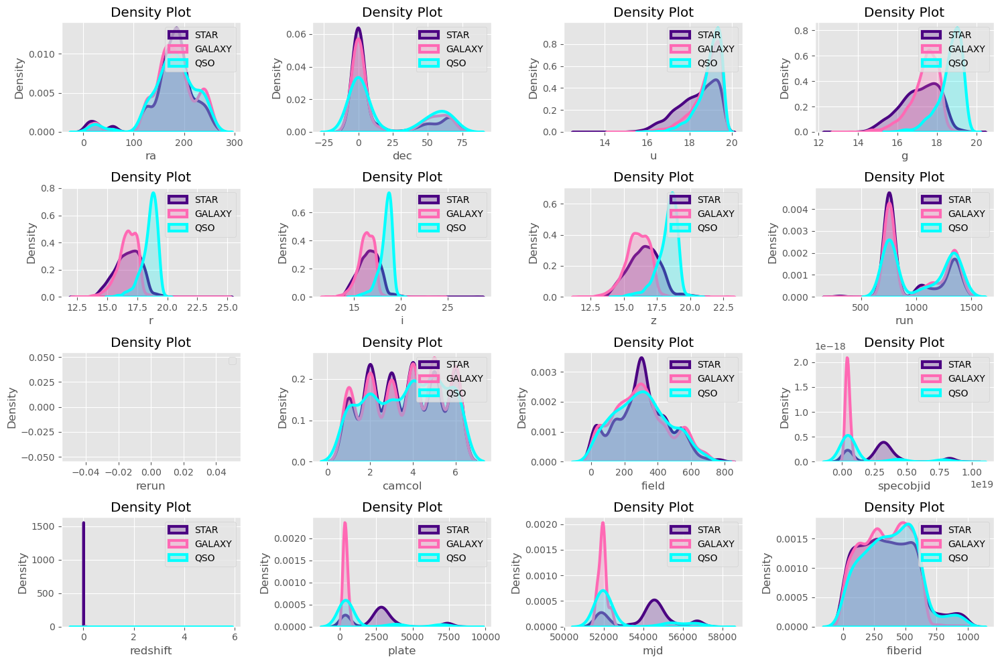

In [349]:
featuredf = df.drop(['class','objid'], axis=1)
featurecols = list(featuredf)
astrObjs = df['class'].unique()
colours = ['indigo', '#FF69B4', 'cyan']
plt.figure(figsize=(15,10))
for i in range(len(featurecols)):
    plt.subplot(4, 4, i+1)
    for j in range(len(astrObjs)):
        sns.distplot(df[df['class']==astrObjs[j]][featurecols[i]], hist = False, kde = True, color = colours[j], kde_kws = {'shade': True, 'linewidth': 3}, label = astrObjs[j])
    plt.legend()
    plt.title('Density Plot')
    plt.xlabel(featurecols[i])
    plt.ylabel('Density')
plt.tight_layout()

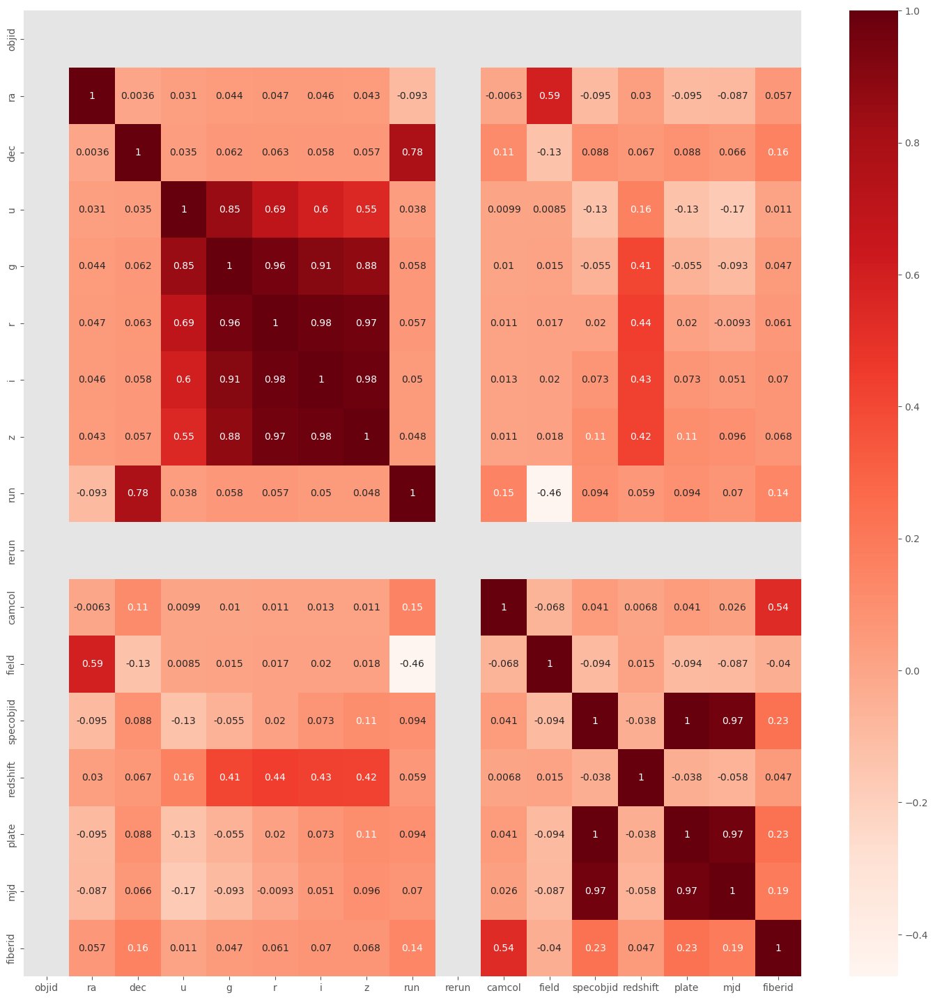

In [350]:
plt.figure(figsize=(18,18))
cor = df.corr()
sns.heatmap(cor, annot=True, cmap=plt.cm.Reds)
plt.show()

In [351]:
df.drop(['objid','rerun','specobjid', 'fiberid'],1,inplace=True) 
# Drop the ID's and 'rerun' (the kind of process of the image).

In [352]:
df

,ra,dec,u,g,r,i,z,run,camcol,field,class,redshift,plate,mjd
0,183.531326,0.089693,19.47406,17.04240,15.94699,15.50342,15.22531,752,4,267,STAR,-0.000009,3306,54922
1,183.598370,0.135285,18.66280,17.21449,16.67637,16.48922,16.39150,752,4,267,STAR,-0.000055,323,51615
2,183.680207,0.126185,19.38298,18.19169,17.47428,17.08732,16.80125,752,4,268,GALAXY,0.123111,287,52023
3,183.870529,0.049911,17.76536,16.60272,16.16116,15.98233,15.90438,752,4,269,STAR,-0.000111,3306,54922
4,183.883288,0.102557,17.55025,16.26342,16.43869,16.55492,16.61326,752,4,269,STAR,0.000590,3306,54922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,131.316413,51.539547,18.81777,17.47053,16.91508,16.68305,16.50570,1345,3,161,GALAXY,0.027583,447,51877
9996,131.306083,51.671341,18.27255,17.43849,17.07692,16.71661,16.69897,1345,3,162,GALAXY,0.117772,447,51877
9997,131.552562,51.666986,18.75818,17.77784,17.51872,17.43302,17.42048,1345,3,162,STAR,-0.000402,7303,57013
9998,131.477151,51.753068,18.88287,17.91068,17.53152,17.36284,17.13988,1345,3,163,GALAXY,0.014019,447,51877


## Separamos nuestros datos en train, validation y test.
A la vez estandarizamos y balanceamos nuestros datos, ya que claramente hay un numero muy pequenio de quasares en comparacion a estrellas y galaxias.

In [353]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn import preprocessing

X = df.drop('class', axis=1) 

y = df["class"] 

#------------------------- TRAIN and TEST ---------------------------
            

# We most balance the dataset, we have GALAXY = 4998, STAR = 4152 and QSO = 850 then QSA is very unbalanced. 
# We use Random Undersampling method to balance the dataset


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=2)


#------------------------- TRAIN and VALIDATION ----------------------




X_train_val, X_validation, y_train_val, y_validation = train_test_split(X_train, y_train, test_size=0.20, random_state=23)



#------------------------- Standardization ----------------------

MinMaxScaler = preprocessing.MinMaxScaler()
X_train_val = MinMaxScaler.fit_transform(X_train_val)   
X_validation = MinMaxScaler.fit_transform(X_validation)
X_test = MinMaxScaler.transform(X_test)

#------------------------- For Clustering ----------------------

X_std = MinMaxScaler.fit_transform(X)

y_int = y.replace({'STAR': 0, 'GALAXY': 1, "QSO":2},  regex=True)



# APPLY THE CLASSIFICATION ALGORITHMS

In [354]:
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_curve
from sklearn.metrics import auc
from sklearn.model_selection import RepeatedStratifiedKFold
from scipy.stats import loguniform




In [355]:
def CM(y_validation, y_pred):

    confusion_matrix(y_validation, y_pred)
    sns.heatmap(confusion_matrix(y_validation, y_pred), annot=True)
    plt.ylabel('Real')
    plt.xlabel('Predicted')
    plt.title('Confusion Matrix')
 
    print (classification_report(y_validation, y_pred))
    
    return


In [356]:
def ROC_Curve(y_pred_proba, y_test=y_test):

    # ROC for GALAXY
    fpr_g, tpr_g, thr_g = roc_curve(y_test, y_pred_proba[:,0], pos_label='GALAXY')
    # ROC for QSO
    fpr_q, tpr_q, thr_q = roc_curve(y_test, y_pred_proba[:,1], pos_label='QSO')
    # ROC for STAR
    fpr_s, tpr_s, thr_s = roc_curve(y_test, y_pred_proba[:,2], pos_label='STAR')

    n = np.arange(0,1,0.01)
    #fig, axs = plt.subplots(2,2, figsize=(11,8), gridspec_kw={'hspace': .3})

    
    fig, axs = plt.subplots(1,3, figsize=(13,4), sharey=True, gridspec_kw={'hspace': .3})

    axs[0].grid()
    axs[0].plot(fpr_g,tpr_g, label='ROC curve')
    axs[0].plot(n,n, color='orange', label='Random')
    axs[0].legend(loc=4)
    axs[0].set_title('ROC - GALAXY')

    axs[0].set_ylabel('Sensitivity')
    axs[1].grid()
    axs[1].plot(fpr_q,tpr_q, label='ROC curve')
    axs[1].plot(n,n, color='orange', label='Random')
    axs[1].legend(loc=4)
    axs[1].set_title('ROC - QSO')
    axs[1].set_xlabel('1 - Specificity')
    axs[2].grid()
    axs[2].plot(fpr_s,tpr_s, label='ROC curve')
    axs[2].plot(n,n, color='orange', label='Random')
    axs[2].legend(loc=4)
    axs[2].set_title('ROC - STAR')

    plt.show()

    # AUC GALAXY
    print(f'AUC GALAXY: {auc(fpr_g,tpr_g).round(3)}')
    # AUC QSO
    print(f'AUC QSO: {auc(fpr_q,tpr_q).round(3)}')
    # AUC STAR
    print(f'AUC STAR: {auc(fpr_s,tpr_s).round(3)}')

    return

In [357]:
def Grid_Search_accuracy(model, H_param, X_train, y_train, X_validation, y_validation):

    #-------------- Grid Search ---------------------

    cv = StratifiedKFold(n_splits=10, random_state=10, shuffle=True)

    #cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    #this "cv" repeats the operation. More statistical weight, but higher computational cost.

    grid = GridSearchCV(model, H_param, scoring='accuracy', n_jobs=-1, cv=cv)

    #-------------- Grid Train ----------------------

    result_grid = grid.fit(X_train, y_train)
    # summarize result
    print('Best Score: %s' % result_grid.best_score_)
    print('Best Hyperparameters: %s' % result_grid.best_params_)
    
    y_pred_grid = grid.predict(X_validation)

    #Performance
    CM(y_validation, y_pred_grid)
    return


In [358]:
def Random_Search_accuracy(model, H_param, X_train, y_train, X_validation, y_validation):


#-------------- Random Search ---------------------

    cv = StratifiedKFold(n_splits=10, random_state=10, shuffle=True)

    #cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    #cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    #this "cv" repeats the operation. More statistical weight, but higher computational cost.

    random = RandomizedSearchCV(model, H_param, n_iter=20, scoring='accuracy', n_jobs=-1, cv=cv, random_state=1)
    # execute search
    result_random = random.fit(X_train, y_train)
    # summarize result
    print('Best Score: %s' % result_random.best_score_)
    print('Best Hyperparameters: %s' % result_random.best_params_)
    
    y_pred_random = random.predict(X_validation)


    #Performance
    CM(y_validation, y_pred_random)
    return

## KNN

---

In Knn we most define the K-number of neighbors in the model, like a hyperparameter. The choice of K can be arbitrary, but we will use Cross Validation, Grid Search and Random Search to find the optimal number of neighbors such that it optimizes the Accuracy.

Firstly we use Cross Validation to find the optimal number of neighbors. For this, we use the K to maximize the Accuracy, Precision, Recall and F1 parameters.

## Hyperparameter Optimization

### Optimization of Accuracy, Recall, Precision and F1-Score.

Use Cross Validation in Accuracy Score

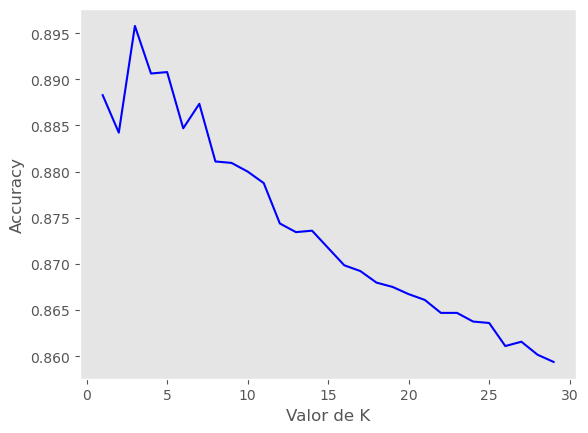

   score_medio  n_neighbors
2     0.895782            3


In [359]:
# We use cross-validation with 7 folds
kf = KFold(n_splits=7, shuffle=True, random_state=12)

scores_para_df = []

for i in range(1, 30):
    
# At each iteration, we instantiate the model with a different hyperparameter
    model = KNeighborsClassifier(n_neighbors=i)
        
# Cross_val_scores returns an array of 5 results, one for each partition automatically made by CV
    cv_scores = cross_val_score(model, X_train_val,  y_train_val, cv=kf, scoring='accuracy')
        
# For each value of n_neighbours, we create a dictionary with the value of n_neighbours and the average of the scores.
    dict_row_score = {'score_medio':np.mean(cv_scores), 'n_neighbors':i}
        
# Save each one in the list of dictionaries
    scores_para_df.append(dict_row_score)
    
# Create the DataFrame from the dictionary list
    df_scores = pd.DataFrame(scores_para_df)

plt.plot(df_scores['n_neighbors'], df_scores['score_medio'], color='b')
plt.xlabel('Valor de K'); plt.ylabel('Accuracy') 
plt.grid()
plt.show()

# Let's see which is the K that gives us the best metrics

print(df_scores.loc[df_scores.score_medio == df_scores.score_medio.max()])
    


We can see that the number of neighbors such that optimizes Accuracy Score (0.89) is K = 3.

## Optimization whit Grid Search and Random Search.

In [360]:
knn = KNeighborsClassifier()

k_range = list(range(1, 31))
H_param_Knn = dict(n_neighbors=k_range) # Define the hyperparameters to optimize

### Grid Search

Best Score: 0.8970312499999998
Best Hyperparameters: {'n_neighbors': 3}
              precision    recall  f1-score   support

      GALAXY       0.84      0.95      0.89       801
         QSO       0.98      0.77      0.86       118
        STAR       0.92      0.83      0.87       681

    accuracy                           0.88      1600
   macro avg       0.92      0.85      0.88      1600
weighted avg       0.89      0.88      0.88      1600



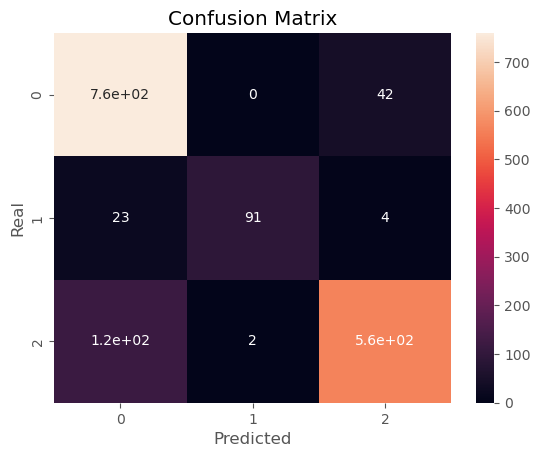

In [361]:
Grid_Search_accuracy(knn, H_param_Knn, X_train_val, y_train_val, X_validation, y_validation)

We obtain that:
- K = 3 is the optimal number of neighbors.
- For this K, the metrics are (for Galaxy, Quasar y Star) Accuracy = 0.88, Precision = (0.84, 0.98, 0.92), Recall = (0.95, 0.77, 0.83), F1 = (0.89, 0.86, 0.87).
- The matrix confusion tell us that the model only not classified well 42 (~6%) Galaxies, 27 (~25%) Quasars and 122 (~25%) Stars.
- We have problems whit Stars classification.

### Randomized Search

Best Score: 0.8970312499999998
Best Hyperparameters: {'n_neighbors': 3}
              precision    recall  f1-score   support

      GALAXY       0.84      0.95      0.89       801
         QSO       0.98      0.77      0.86       118
        STAR       0.92      0.83      0.87       681

    accuracy                           0.88      1600
   macro avg       0.92      0.85      0.88      1600
weighted avg       0.89      0.88      0.88      1600



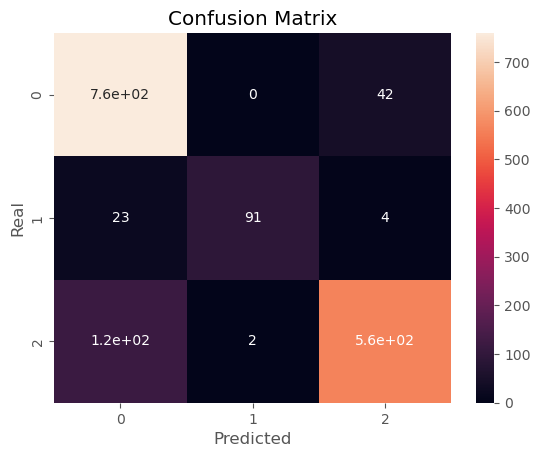

In [362]:
Random_Search_accuracy(knn, H_param_Knn, X_train_val, y_train_val, X_validation, y_validation)

We obtain exactly the same performance and K as in Grid.

## Fit The KNN-Model

              precision    recall  f1-score   support

      GALAXY       0.84      0.95      0.89       801
         QSO       0.98      0.77      0.86       118
        STAR       0.92      0.83      0.87       681

    accuracy                           0.88      1600
   macro avg       0.92      0.85      0.88      1600
weighted avg       0.89      0.88      0.88      1600



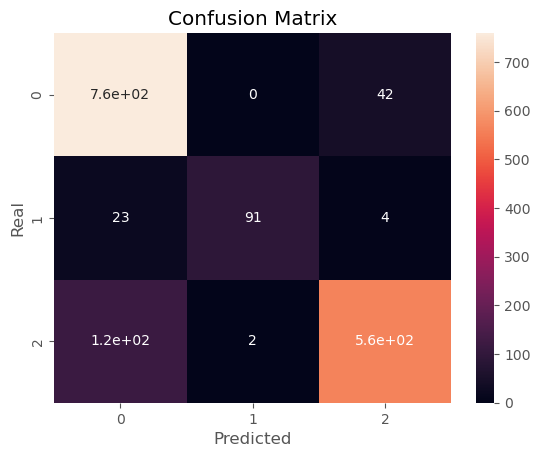

In [363]:

model_knn = KNeighborsClassifier(n_neighbors=3)
model_knn.fit(X_train_val, y_train_val)
y_pred_knn = model_knn.predict(X_validation)

CM(y_validation, y_pred_knn)



Finally in the validation process, we have the same performance that before.
- The metrics are (for Galaxy, Quasar y Star) Accuracy = 0.88, Precision = (0.84, 0.98, 0.92), Recall = (0.95, 0.77, 0.83), F1 = (0.89, 0.86, 0.87).
- The matrix confusion tell us that the model only not classified well 42 (~6%) Galaxies, 27 (~25%) Quasars and 122 (~25%) Stars.
- We continue to have problems with the star classification.

# Logistic Regresion
---

To optimized the hyperparameters we use Grid Search, and obtein the value of penalty, C and solver for the best score.

In [364]:
#-------------- Define Model -------------------

LR = LogisticRegression()

#-------------- Parameters-----------------------

H_param_LR_grid = dict()
H_param_LR_grid['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
H_param_LR_grid['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
H_param_LR_grid['C'] = [1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]

H_param_LR_random = dict()
H_param_LR_random['solver'] = ['newton-cg', 'lbfgs', 'liblinear']
H_param_LR_random['penalty'] = ['none', 'l1', 'l2', 'elasticnet']
H_param_LR_random['C'] = np.logspace(0.1, 100, 10, endpoint=True)



### Grid Search

Best Score: 0.9915625
Best Hyperparameters: {'C': 1e-05, 'penalty': 'none', 'solver': 'newton-cg'}
              precision    recall  f1-score   support

      GALAXY       0.99      0.99      0.99       801
         QSO       0.99      0.92      0.95       118
        STAR       0.99      1.00      1.00       681

    accuracy                           0.99      1600
   macro avg       0.99      0.97      0.98      1600
weighted avg       0.99      0.99      0.99      1600



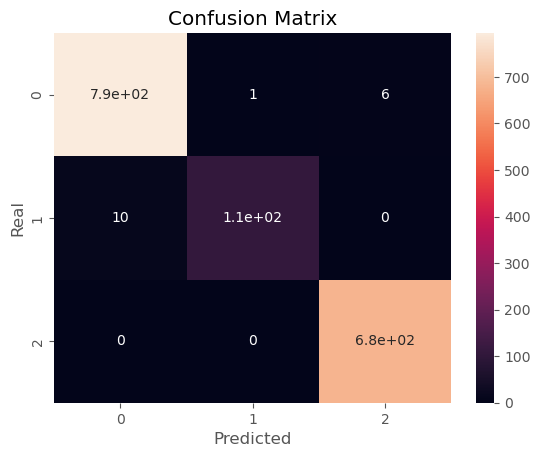

In [365]:
Grid_Search_accuracy(LR, H_param_LR_grid, X_train_val, y_train_val, X_validation, y_validation)

We obtain that:
- The best hyperparameters to maximize Accuracy are C = 1e-05, Penalty = 'none' and Solver = 'newton-cg'.
- For this hyperparameters, the metrics are (for Galaxy, Quasar y Star) Accuracy = 0.99, Precision = (0.99, 0.99, 0.99), Recall = (0.99, 0.92, 1), F1 = (0.99, 0.95, 1).
- The matrix confusion tell us that the model only not classified well 7 (~1%) Galaxies, 10 (~7%) Quasars and 0 (0%) Stars.

### Random Search

Best Score: 0.9915625
Best Hyperparameters: {'solver': 'newton-cg', 'penalty': 'l2', 'C': 3.162277660168431e+44}
              precision    recall  f1-score   support

      GALAXY       0.99      0.99      0.99       801
         QSO       0.99      0.92      0.95       118
        STAR       0.99      1.00      1.00       681

    accuracy                           0.99      1600
   macro avg       0.99      0.97      0.98      1600
weighted avg       0.99      0.99      0.99      1600



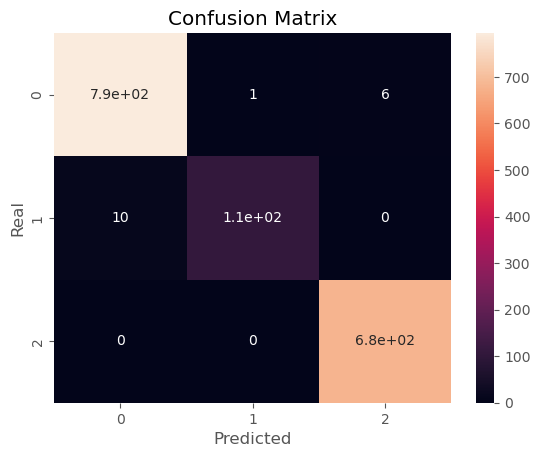

In [366]:
Random_Search_accuracy(LR, H_param_LR_random, X_train_val, y_train_val, X_validation, y_validation)

We obtain that:
- The best hyperparameters to maximize Accuracy are C = 3.16, Penalty = 'l2' and Solver = 'newton-cg'.
- The performance is the same as Grid.

## Make the best model

In [367]:
model_LR = LogisticRegression(penalty='none',C=1e-05, solver='newton-cg', random_state=44)
model_LR.fit(X_train_val, y_train_val)

print(model_LR.score(X_train_val, y_train_val))
print(model_LR.score(X_validation, y_validation))

0.99234375
0.989375


              precision    recall  f1-score   support

      GALAXY       0.99      0.99      0.99       801
         QSO       0.99      0.92      0.95       118
        STAR       0.99      1.00      1.00       681

    accuracy                           0.99      1600
   macro avg       0.99      0.97      0.98      1600
weighted avg       0.99      0.99      0.99      1600



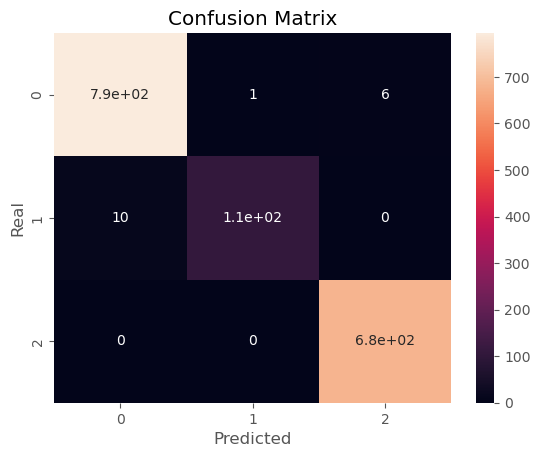

In [368]:
y_pred_LR = model_LR.predict(X_validation)

CM(y_validation,y_pred_LR)


Making the validation we obtain that the metrics are (for Galaxy, Quasar y Star) Accuracy = 0.99, Precision = (0.99, 0.97, 0.99), Recall = (0.99, 0.93, 1), F1 = (0.99, 0.95, 0.99).The matrix confusion tell us that the model only not classified well 9 (1%) Galaxies, 8 (7%) Quasars and 1 (0.1%) Stars.

Exactly the same that obtain be Grid.

In [369]:
print(model_LR.coef_)
print(model_LR.intercept_)

[[ 1.44728041e+00  1.00850983e+00  1.33491221e+01 -8.23758187e+00
  -4.09958601e+01 -6.71092785e-01  2.72710847e+01 -8.72522448e-01
  -4.17938681e-01 -2.13972797e-01  2.47097685e+03 -8.49743610e+00
   5.79784057e+00]
 [ 7.77195061e-01  1.90656643e+00 -2.40077913e+01  2.89181441e+01
   2.86867916e+01 -5.64427604e+00 -3.04631848e+01 -3.03814804e+00
  -3.53534100e-01 -1.11877336e+00  2.51040034e+03 -1.07357400e-01
  -4.48265938e-01]
 [-2.22447556e+00 -2.91507650e+00  1.06586690e+01 -2.06805624e+01
   1.23090683e+01  6.31536871e+00  3.19209996e+00  3.91067034e+00
   7.71472969e-01  1.33274601e+00 -4.98137719e+03  8.60479278e+00
  -5.34957539e+00]]
[-5.76782535 -2.02805922  7.79588445]


# Naive Bayes
---

Here, we are working under the assumption that the features are independent of each other, and we have several algothms of Naive Bayes: **Gaussian Naive Bayes**, **Multinomial Naive Bayes**, **Bernoulli Naive Bayes**, etc. 

## Gaussian Naive Bayes 

              precision    recall  f1-score   support

      GALAXY       0.73      0.98      0.84       801
         QSO       0.50      0.92      0.64       118
        STAR       1.00      0.44      0.61       681

    accuracy                           0.75      1600
   macro avg       0.74      0.78      0.70      1600
weighted avg       0.83      0.75      0.73      1600



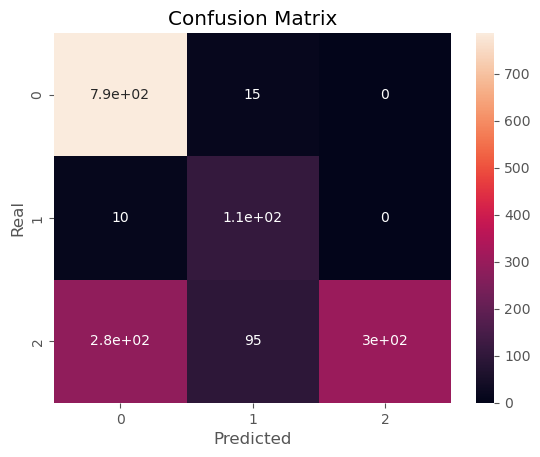

In [370]:
model_NB_G = GaussianNB()

model_NB_G.fit(X_train_val, y_train_val)

y_pred_NB_G = model_NB_G.predict(X_validation)

CM(y_validation, y_pred_NB_G)

Making the validation we obtain that the metrics are (for Galaxy, Quasar y Star) Accuracy = 0.75, Precision = (0.73, 0.50, 1), Recall = (0.98, 0.92, 0.44), F1 = (0.84, 0.64, 0.91).The matrix confusion we can se a serious problem in the classification of "Stars".

## Concluciones de los modelos en general

In **K-NN** the metrics train-validation are:

* Accuracy: **0.88**
* Precision:  G = **0.88**, Q = **0.98**, S = **0.92**
* Recall: G = **0.95**, Q = **0.77**, S = **0.83**
* F1-score: G = **0.89**, Q = **0.86**, S = **0.87**

In **Logistic Regresion** the metrics train-validation are:

* Accuracy: **0.99**
* Precision:  G = **0.99**, Q = **0.99**, S = **0.99**
* Recall: G = **0.99**, Q = **0.92**, S = **1**
* F1-score: G = **0.99**, Q = **0.95**, S = **1**

In **Naive Bayes** the metrics train-validation are:

* Accuracy: **0.72**
* Precision:  G = **0.73**, Q = **0.50**, S = **1**
* Recall: G = **0.98**, Q = **0.92**, S = **0.44**
* F1-score: G = **0.84**, Q = **0.64**, S = **0.91**


In this stage, **Linear Regresion** model has a better performance than **Naive Bayes** model, and **Naive Bayes** is better in comparison to **K-NN** model.

Now we are going to test the models with X_test and y_test data.

              precision    recall  f1-score   support

      GALAXY       0.83      0.97      0.90       972
         QSO       1.00      0.78      0.87       184
        STAR       0.94      0.80      0.87       844

    accuracy                           0.88      2000
   macro avg       0.92      0.85      0.88      2000
weighted avg       0.89      0.88      0.88      2000



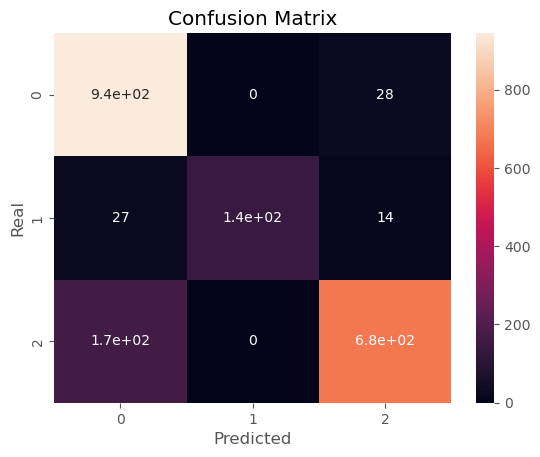

In [371]:
y_pred_TEST_knn = model_knn.predict(X_test)
y_pred_proba_knn = model_knn.predict_proba(X_test)
CM(y_test, y_pred_TEST_knn)

              precision    recall  f1-score   support

      GALAXY       0.98      0.99      0.99       972
         QSO       0.99      0.90      0.95       184
        STAR       0.99      1.00      1.00       844

    accuracy                           0.99      2000
   macro avg       0.99      0.96      0.98      2000
weighted avg       0.99      0.99      0.99      2000



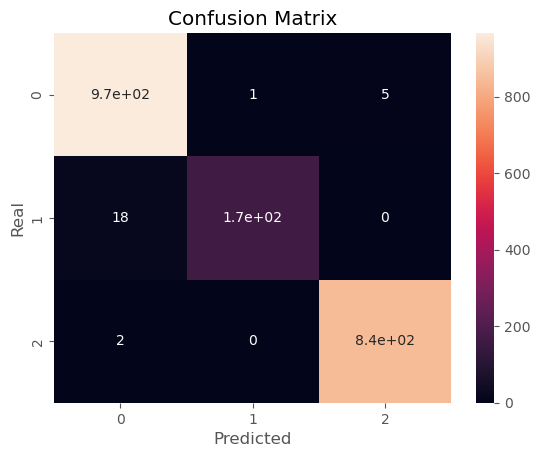

In [372]:
y_pred_TEST_LR = model_LR.predict(X_test)
y_pred_proba_LR = model_LR.predict_proba(X_test)
CM(y_test, y_pred_TEST_LR)

              precision    recall  f1-score   support

      GALAXY       0.71      0.98      0.82       972
         QSO       0.59      0.93      0.72       184
        STAR       0.99      0.42      0.59       844

    accuracy                           0.74      2000
   macro avg       0.76      0.78      0.71      2000
weighted avg       0.82      0.74      0.71      2000



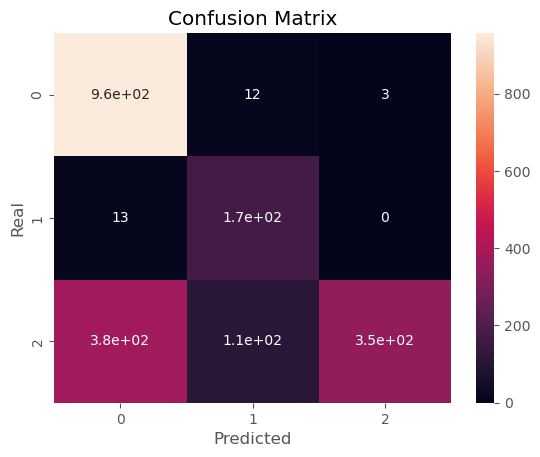

In [373]:
y_pred_TEST_NB_G = model_NB_G.predict(X_test)
y_pred_proba_NB_G = model_NB_G.predict_proba(X_test)
CM(y_test, y_pred_TEST_NB_G)

### In this test, we can see the superiority of Logistic Regression over the other two models, surpassing them by 10 points or more in several aspects.

# Let's see how effective our best model is with each of the classes.

La Curva ROC evalua la relación entre specificity (o su inversa 1−𝐹𝑃𝑅 , tasa de falsos negativos) y sensitivity o recall (o también llamada 𝑇𝑃𝑅, tasa de verdaderos positivos).


Remember that while more close are our cure of the "precfect curve" (max specificity and max sensitivity), best is the perforformance of the model (and umbrals).

<img src="https://raw.githubusercontent.com/Digital-House-DATA/ds_blend_2021_img/master/M4/CLASE_30_Ev-Modelos_Grid-Search/Presentacion/img/M4_CLASE_30_roc_5.png" alt="Drawing" style="width: 300px;"/>

Let´s see the performance of each one

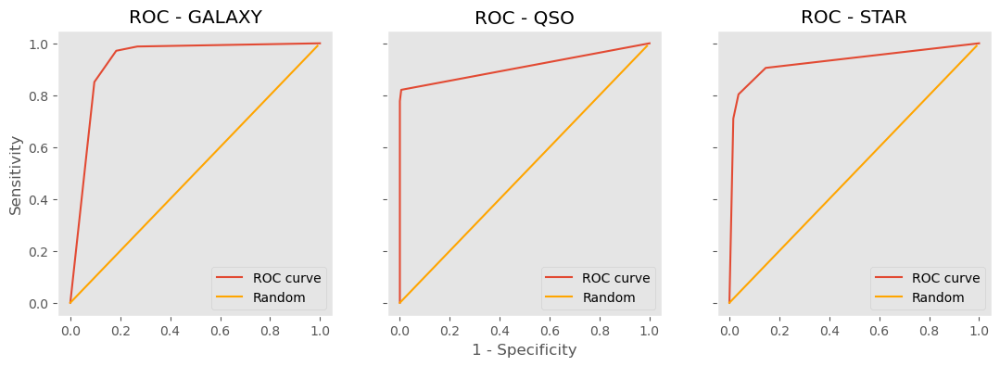

AUC GALAXY: 0.931
AUC QSO: 0.91
AUC STAR: 0.929


In [374]:
ROC_Curve(y_pred_proba_knn)

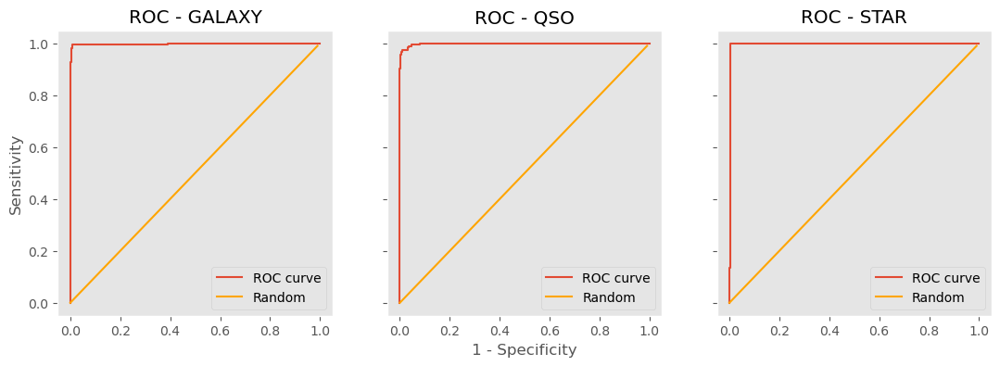

AUC GALAXY: 0.997
AUC QSO: 0.999
AUC STAR: 0.998


In [375]:
ROC_Curve(y_pred_proba_LR)

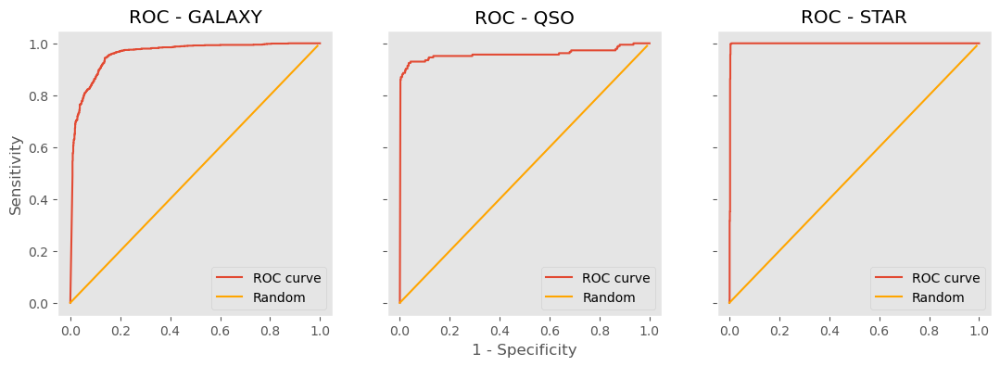

AUC GALAXY: 0.959
AUC QSO: 0.959
AUC STAR: 0.998


In [376]:
ROC_Curve(y_pred_proba_NB_G)

### We see that, in general, "Galaxy" had the worst score, and "Star" obtained the best score overall. In Logistic regression the AUC score was almost perfect.

# Clustering

---

##  K-Means Clustering

Is a unsupervised Learning algorithm which groups together the X targets according its regularities.
So I will drop the y targets and apply the clustering. We will use X_std to Clustering algorithm.

In [377]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score,silhouette_samples
from sklearn.metrics import calinski_harabasz_score


We have two hyper-parameters: n_clusters clusters and n_init number of iterations.

### Elbow Rule

To know the optimal number of clusters, we use the elbow rule. For this, plot different clusters and see its evolution.

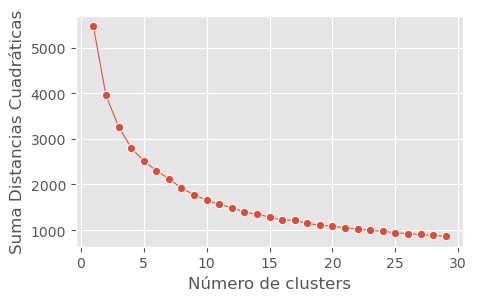

In [378]:
sq_distances=[]; k_values=range(1,30);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(X_std)
    sq_distances.append(kmeans.inertia_)

plt.figure(figsize=(5,3)); sns.lineplot(x=k_values,y=sq_distances,marker='o',size=30,legend=False);
plt.ylabel('Suma Distancias Cuadráticas');plt.xlabel('Número de clusters');    

If the number of K clusters is equal to the number of data points, "Suma Distancias Cuadraticas" will be cero. The elbow rule basically is choose the K cluster that the number where "the elbow is" in other words, the K where the curve flattens. In this case, the elbow happens in K = [7,11].

### Silhouette and Calinski-Harabasz score

The Silhouette coefficient measures how close a point is to the rest of the points in the same cluster, relative to how close it is to the points in the nearest cluster. To obtain a clustering score, make the mean of Silhouette coefficients.

## 

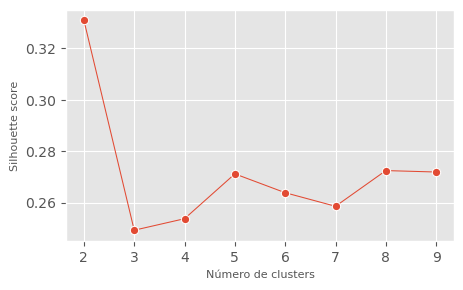

In [379]:
sil=[]; k_values=range(2,10);

for k in k_values:
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(X_std); score=silhouette_score(X_std,kmeans.labels_)
    sil.append(score)

plt.figure(figsize=(5,3));sns.lineplot(x=k_values,y=sil,marker='o',size=30,legend=False);
plt.ylabel('Silhouette score',fontsize=8);plt.xlabel('Número de clusters',fontsize=8);

We search maximize the score, so the best K-number of clusters is 3.

If we want see on detailed, we can plot the distributions of the coefficients $s_i$ for each partition of the data:

(It is worth mentioning that the choice of the XY axes as ra and dec is completely arbitrary, possibly it is more interesting to see clusters with the bands or related to the redshift)

For n_clusters = 2 The average silhouette_score is : 0.3310052938560524
For n_clusters = 3 The average silhouette_score is : 0.24923904479705106
For n_clusters = 4 The average silhouette_score is : 0.2539617647506004
For n_clusters = 5 The average silhouette_score is : 0.26117471431255707
For n_clusters = 6 The average silhouette_score is : 0.25775871770721076
For n_clusters = 7 The average silhouette_score is : 0.27490766421919927
For n_clusters = 8 The average silhouette_score is : 0.2745857014455837
For n_clusters = 9 The average silhouette_score is : 0.2817207768465708


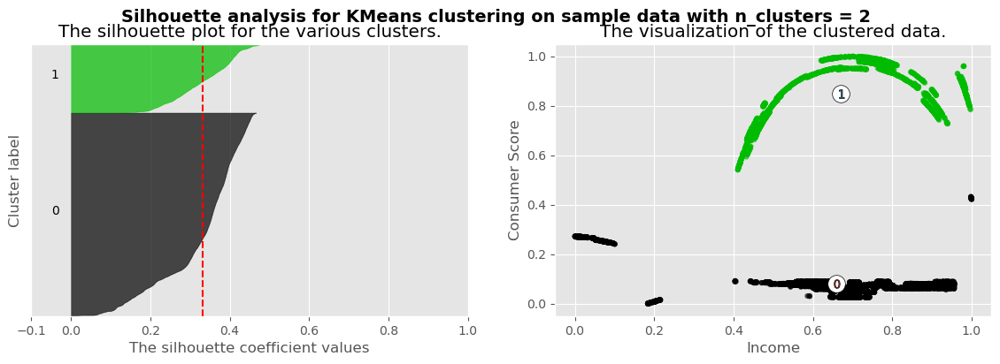

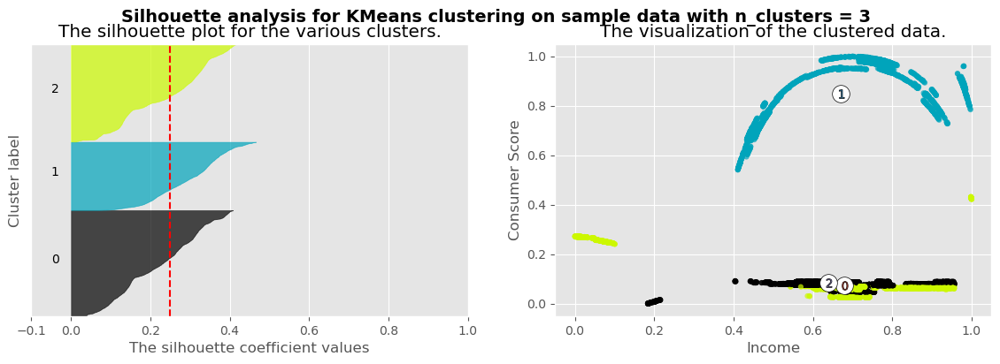

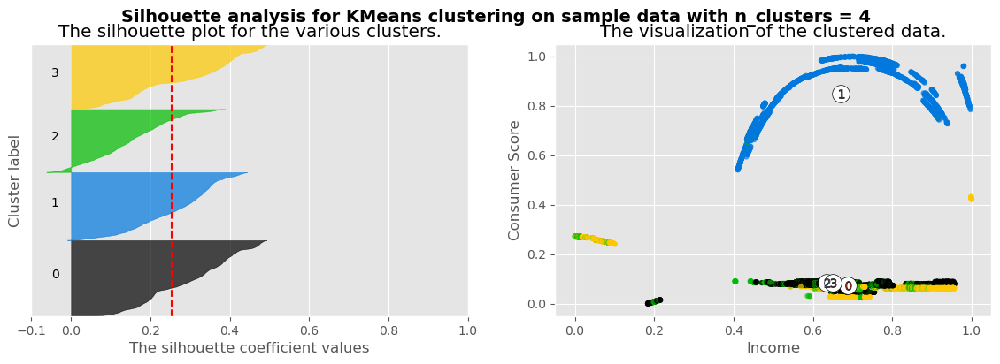

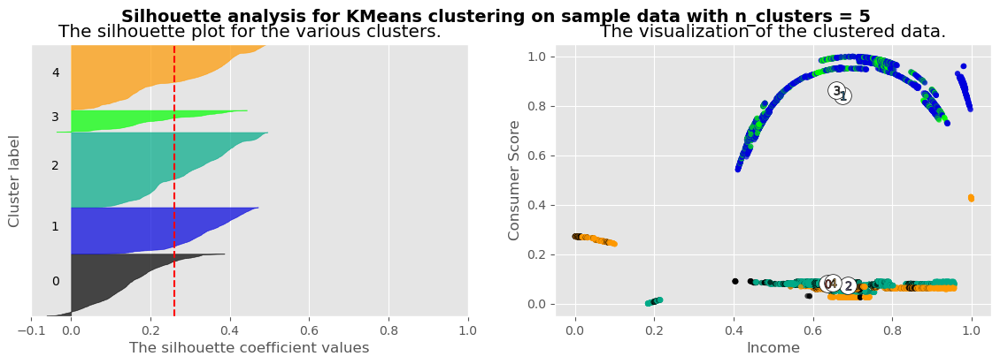

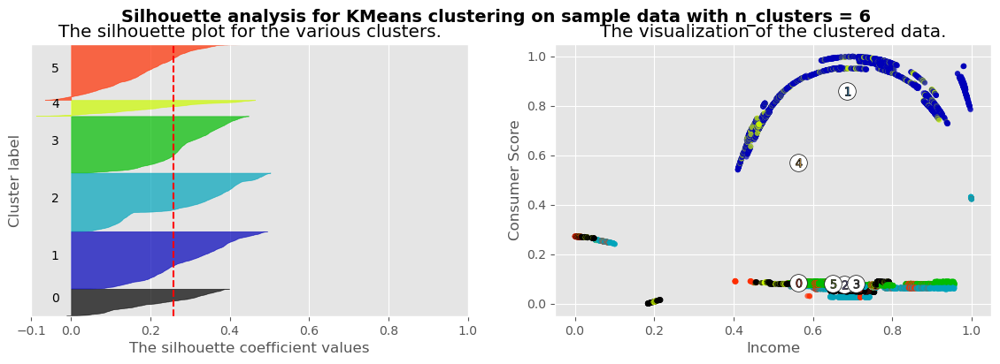

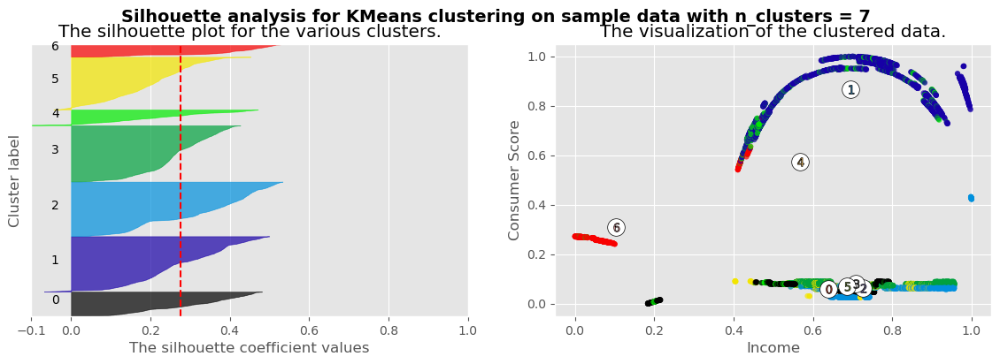

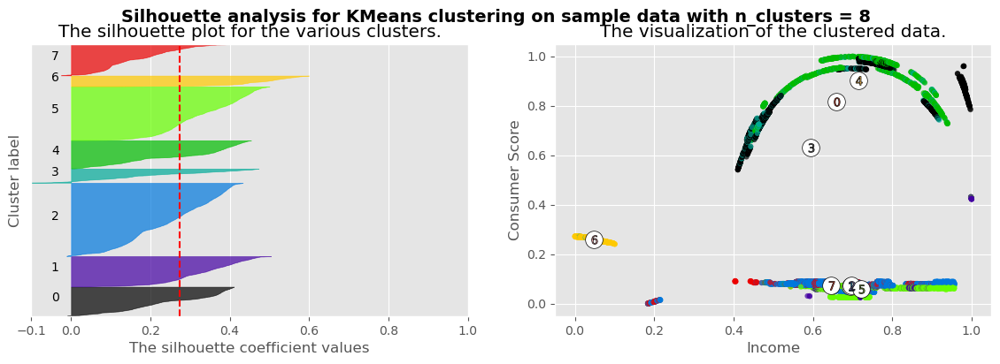

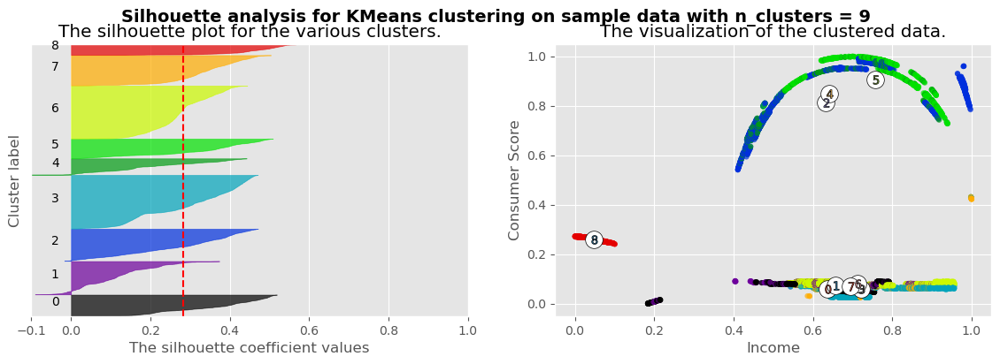

In [380]:
import matplotlib.cm as cm

for n_clusters in range(2,10):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(14, 4)
    
    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X_std)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_std, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_std, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(X_std[:, 0], X_std[:, 1], marker='.', s=80, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Income")
    ax2.set_ylabel("Consumer Score")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')


The Red-Line is the mean of the score, and we can see the the $s_i$ values for each cluster and see what clusters are better defined. To determine which number of clusters is the best, we search:
- The thickness of the strips must be similar for all the bands.
- Most (or better all) bands should exceed the average (red line).

The number 3 and 4 of clusters meet these conditions better than the others. So we can define the number of clusters in 3 or 4.

The Calinski-Harabasz score measures the relationship between inter-cluster dispersion and intra-cluster dispersion. 

A well-defined cluster structure has high dispersion between different clusters and low dispersion within each cluster.

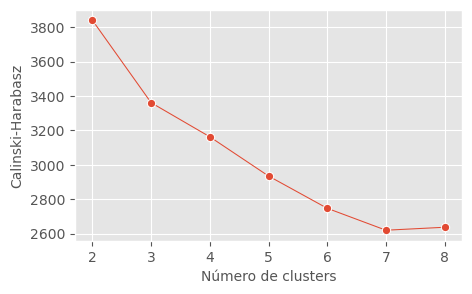

In [381]:
k_values=range(2,9); ch_scores=[]

for k in k_values:  
    kmeans=KMeans(n_clusters=k,n_init=10,random_state=0) # Numero de repeticiones=10
    kmeans.fit(X_std)
    score=calinski_harabasz_score(X_std,kmeans.labels_)
    ch_scores.append(score)

plt.figure(figsize=(5,3));
sns.lineplot(x=k_values,y=ch_scores,marker='o',size=30,legend=False);
plt.ylabel('Calinski-Harabasz',fontsize=10);plt.xlabel('Número de clusters',fontsize=10);

When this plot shows a peak we use the k than corresponding to it, but if we haven´t a peak most use other scoring.

In [382]:
kmeans = KMeans(n_clusters=3,n_init=10,random_state=0) # Numero de repeticiones=10

kmeans.fit(X_std)

# Here we have the parameters

labels_kmeans = kmeans.labels_ 
centroids_kmeans = kmeans.cluster_centers_
inertia_kmeans = kmeans.inertia_

print(labels_kmeans)
print(centroids_kmeans)
print(inertia_kmeans) #The lesser the model inertia, the better the model fit.

#We can see that the model has very high inertia. So, this is not a good model fit to the data.

[2 2 2 ... 1 1 1]
[[0.63955184 0.08602156 0.84622699 0.63427623 0.35152618 0.28184167
  0.42380092 0.48319386 0.19922092 0.43617059 0.02362653 0.13399071
  0.22645093]
 [0.66945231 0.84855079 0.86006672 0.65760936 0.36664294 0.29325024
  0.44003162 0.9441957  0.58775348 0.32935176 0.03616073 0.18025101
  0.25925962]
 [0.67833549 0.07498758 0.85129144 0.63966358 0.35439302 0.28418839
  0.42619233 0.51017188 0.79753277 0.37348391 0.02572785 0.1368356
  0.21778062]]
3269.1581667682026


Measure the performance whit the true labels.

              precision    recall  f1-score   support

           0       0.46      0.40      0.43      4152
           1       0.54      0.27      0.36      4998
           2       0.08      0.35      0.13       850

    accuracy                           0.33     10000
   macro avg       0.36      0.34      0.30     10000
weighted avg       0.47      0.33      0.37     10000



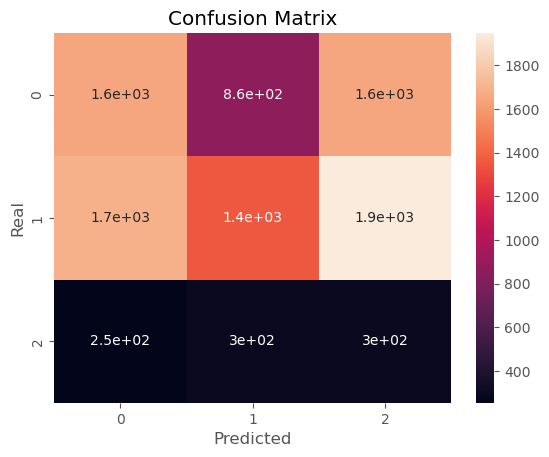

In [383]:
CM(y_int, labels_kmeans)

## Clustering hierarchical

Here, at the start, all point has a cluster and in each iteration united in 1 cluster the two points more closely. We will use a dendogram to determine the cutoff point of clusters. 

<img src="https://raw.githubusercontent.com/Digital-House-DATA/ds_blend_2021_img/master/M4/CLASE_31_Clustering/Presentacion/img/M4_CLASE_31_008_jerarquico.PNG" alt="jerarquico" width=60% height=45% />

We don´t need estimate a number of clusters a priori. 
We have two elements: a linkage and a unite measure.

<img src="https://raw.githubusercontent.com/Digital-House-DATA/ds_blend_2021_img/master/M4/CLASE_31_Clustering/Presentacion/img/M4_CLASE_31_010_linkage.png" alt="linkage" width=80% height=75% />

Ward is the Linkage for default, but if we have clusters whit different number of members Complete or Average are better options. 

In [384]:
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet, fcluster
from scipy.spatial.distance import pdist
from scipy.cluster import hierarchy 

## Cophenetic coefficient

Compares the original distances between the observations, with the distances of the clusters to which they belong.

A coefficient close to one is ideal; it indicates that the two distances are highly correlated.

The Cophenetic coefficient of our model use linkage Ward is:

In [385]:
# Compare between all kinds of linkage

def plot_dendrogram(X_sc,method,ax):
    Z = linkage(X_sc, method);
    c,dists=cophenet(Z, pdist(X_sc));
    ax.set_title(method+' c='+str(np.around(c,2)))        
    ax.set_xticklabels([])
    dendrogram(Z, leaf_rotation=90., leaf_font_size=5.,  
              color_threshold=0, truncate_mode='lastp', ax=ax)        
    return  

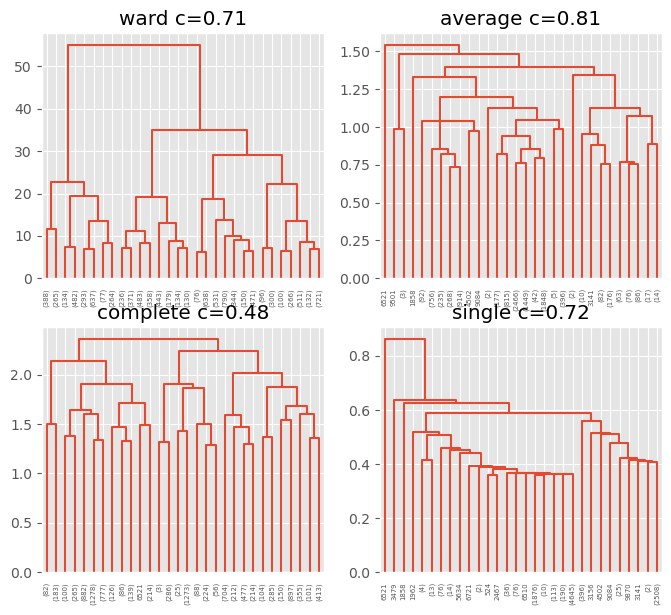

In [386]:
fig,axes=plt.subplots(2,2,figsize=(8,7))
plot_dendrogram(X_std,'ward',axes[0,0])
plot_dendrogram(X_std,'average',axes[0,1])
plot_dendrogram(X_std,'complete',axes[1,0])
plot_dendrogram(X_std,'single',axes[1,1])   ## USAR COMPLETE
plt.show()

Average has a C highest that all, but in Ward o Complete we can see a better distribution of clusters to can choose one.

In [387]:
Z = linkage(X_std, 'ward') 

In [388]:
Z[:10,:]

# Z is a matrix that contains: columns 1 and 2 are the clusters that unites, the column 3 is the distance between 
# the two clusters, and the column 4 is the number of observations in the cluster being formed. 

array([[7.83100000e+03, 7.83500000e+03, 3.10575906e-03, 2.00000000e+00],
       [4.45000000e+03, 4.45100000e+03, 3.41226556e-03, 2.00000000e+00],
       [3.68400000e+03, 3.68900000e+03, 4.48864144e-03, 2.00000000e+00],
       [9.17600000e+03, 9.17700000e+03, 4.53115660e-03, 2.00000000e+00],
       [2.90100000e+03, 2.90400000e+03, 4.56344708e-03, 2.00000000e+00],
       [6.32500000e+03, 6.32900000e+03, 4.61970563e-03, 2.00000000e+00],
       [6.00000000e+01, 6.10000000e+01, 4.72388471e-03, 2.00000000e+00],
       [1.01500000e+03, 1.02300000e+03, 5.05967647e-03, 2.00000000e+00],
       [7.12900000e+03, 7.13600000e+03, 5.28986898e-03, 2.00000000e+00],
       [9.93100000e+03, 9.93300000e+03, 5.31332768e-03, 2.00000000e+00]])

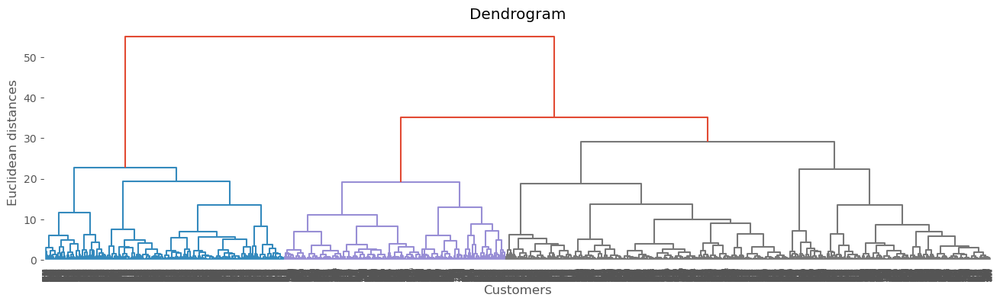

In [389]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
###############################     DENDOGRAMA 1

plt.figure(1, figsize = (16 ,4))
dendrogram = sch.dendrogram(Z, color_threshold=32)

plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

# Only make this graph because I think it looks great

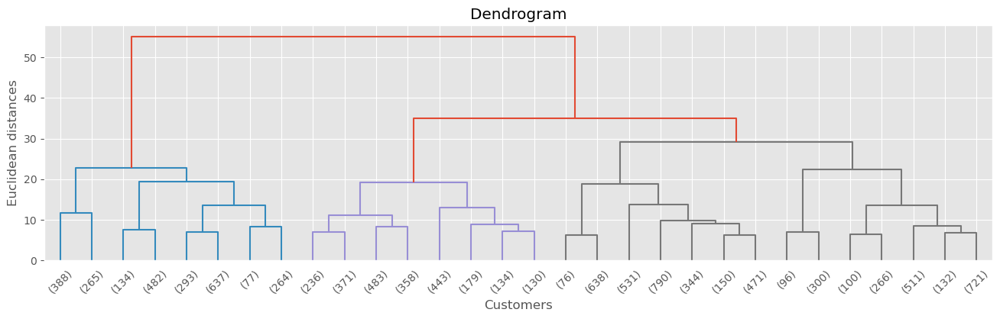

In [390]:
import scipy.cluster.hierarchy as sch
from sklearn.cluster import AgglomerativeClustering 
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
###############################     DENDOGRAMA 1

plt.figure(1, figsize = (16 ,4))
dendrogram = sch.dendrogram(Z, color_threshold=32, truncate_mode='lastp')

plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distances')
plt.show()

In [391]:
labels_hc=fcluster(Z,2,criterion='maxclust');



Measure the performance whit the real labels.

              precision    recall  f1-score   support

           0       0.00      0.00      0.00      4152
           1       0.53      0.27      0.36      4998
           2       0.07      0.65      0.13       850

    accuracy                           0.19     10000
   macro avg       0.20      0.31      0.16     10000
weighted avg       0.27      0.19      0.19     10000



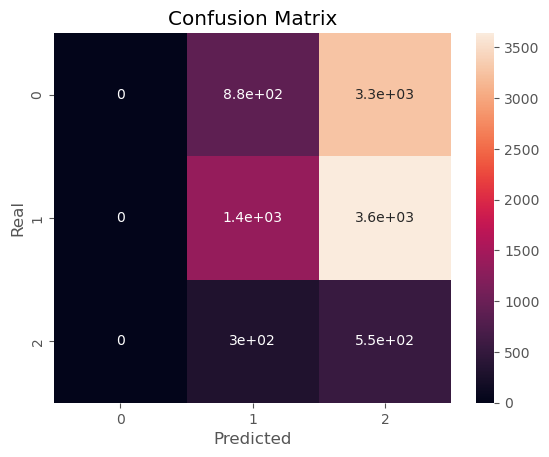

In [392]:
CM(y_int, labels_hc)

### DBSCAN

Density Based Spatial Clustering of Applications with Noise, have two hyperparameters: 

- epsilon: maximum distance between two points to consider them as belonging to the same cluster (similar to the concept of "closeness").

- min_points: minimum number of points needed to form a cluster (to avoid the formation of too small clusters).

We have three kinds of points: 

- Core: points that have at least *min-points* neighbors within an *Eps radius*. They are *high density* points.

- Border: points that are within the radius of a core point, but do not fulfill the core condition. They are the *cluster boundaries*.

- Noise: points that do not meet the *core or border condition. They are *outliers or noise*, and do not belong to any cluster.

The basic algorithm is: A point is selected at random, and its neighborhood is determined using the *epsilon* radius. If it has at least *min_points* neighbors, it is marked as *core*, and a cluster is created, say "A". Otherwise, it is marked as *noise*. All neighboring points of the *core* are assigned to cluster "A".If some of these points are *core*, the points it has as neighbors are incorporated into cluster "A", if they were not already selected.
A new unprocessed point is selected, and the steps are repeated.
The process ends when all points have been visited.

Optimization of hyperparameters: If we know about the data domain, Epsilon is a typical physically meaningful distance and minPts is the minimum size for clusters. 


Also, we have the heuristics:

- minPts: A rule of thumb is to assign this parameter as a function of the number of D dimensions in the dataset. In general minPts=2D is chosen, but it can be a larger value for very large, noisy or duplicate data datasets.

- epsilon: Can be determined by looking at a graph of distances to the k-th neighbor, with k=minPts-1. The distance to the k-th nearest neighbor of each point is calculated and then these distances are plotted from largest to smallest. A good choice of epsilon is the bend or break point of the curve.

In [393]:
X_std # How we have a dimensionallity of 13, our "minPts" should be 2*13 = 26.

array([[6.93832273e-01, 7.40254729e-02, 9.80964857e-01, ...,
        7.70273543e-04, 3.73280943e-01, 5.66491614e-01],
       [6.94097640e-01, 7.46422070e-02, 8.58249898e-01, ...,
        7.61699432e-04, 6.99901768e-03, 6.26799932e-03],
       [6.94421555e-01, 7.45191099e-02, 9.67187673e-01, ...,
        2.37490694e-02, 2.57858546e-03, 7.53853973e-02],
       ...,
       [4.88097418e-01, 7.71724013e-01, 8.72677520e-01, ...,
        6.96997371e-04, 8.64071709e-01, 9.20718279e-01],
       [4.87798936e-01, 7.72888457e-01, 8.91538709e-01, ...,
        3.38840082e-03, 2.22249509e-02, 5.06522107e-02],
       [4.88542500e-01, 7.73595116e-01, 9.50984203e-01, ...,
        2.28730132e-02, 2.22249509e-02, 5.06522107e-02]])

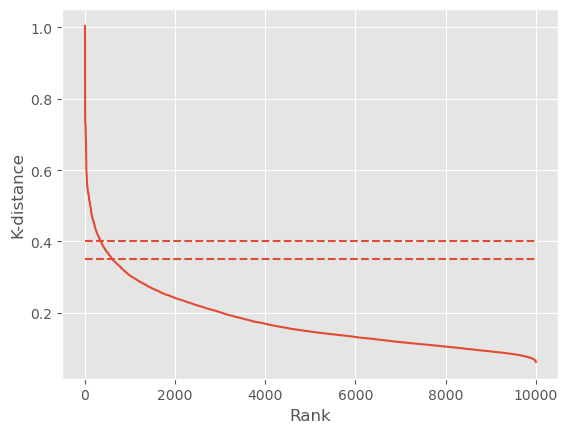

In [394]:
from scipy.spatial.distance import pdist,squareform
from sklearn.cluster import DBSCAN
plt.style.use('ggplot')
%matplotlib inline

minPts=26
k=minPts-1

D=squareform(pdist(X_std));
k_distances=np.zeros(D.shape[0]);

for i in range(D.shape[0]):
    distances=np.sort(D[i]);
    k_distances[i]=distances[k];
    
k_distances=np.sort(k_distances); k_distances=k_distances[::-1];
    
plt.plot(k_distances); plt.xlabel('Rank'); plt.ylabel('K-distance');
plt.hlines([0.4,0.35],0,10000,linestyles='dashed');

The best Epsilon value is between [0.35, 0.4]

In [395]:
dbscan = DBSCAN(eps=0.4, min_samples=26)
y_dbscan = dbscan.fit_predict(X_std)
y_dbscan

# Lista de los puntos core y máscara para graficar
core_samples_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_samples_mask[dbscan.core_sample_indices_] = True

labels_dbscan = dbscan.labels_
unique_labels=set(labels_dbscan)

    

In [396]:
print("Silhouette Coefficient: %0.3f" % silhouette_score(X_std, labels_dbscan))
print("Calinsky-Harabasz Index: %0.3f" % calinski_harabasz_score(X_std, labels_dbscan))

Silhouette Coefficient: 0.203
Calinsky-Harabasz Index: 1268.205


In [397]:
dbscan.labels_[dbscan.labels_ == -1].size 

94

Measure the performance whit the real labels

              precision    recall  f1-score   support

          -1       0.00      0.00      0.00         0
           0       0.43      0.72      0.54      4152
           1       0.44      0.03      0.06      4998
           2       0.00      0.00      0.00       850
           3       0.00      0.00      0.00         0

    accuracy                           0.31     10000
   macro avg       0.17      0.15      0.12     10000
weighted avg       0.40      0.31      0.25     10000



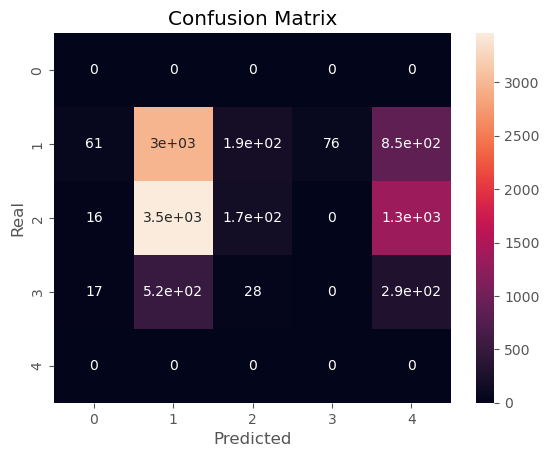

In [398]:
CM(y_int,labels_dbscan)

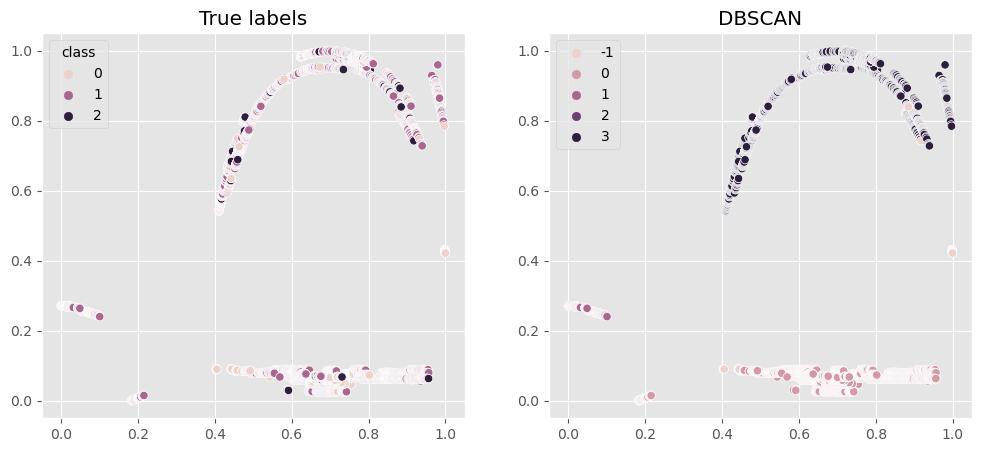

In [399]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,0], y = X_std[:,1],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,0], y = X_std[:,1],hue=labels_dbscan,ax=ax[1])
ax[1].set_title('DBSCAN');

## Conclusions

How we can see, all clustering models has a really bad performance. The reason is that our data not has a "gour distribution" to which make clustering.

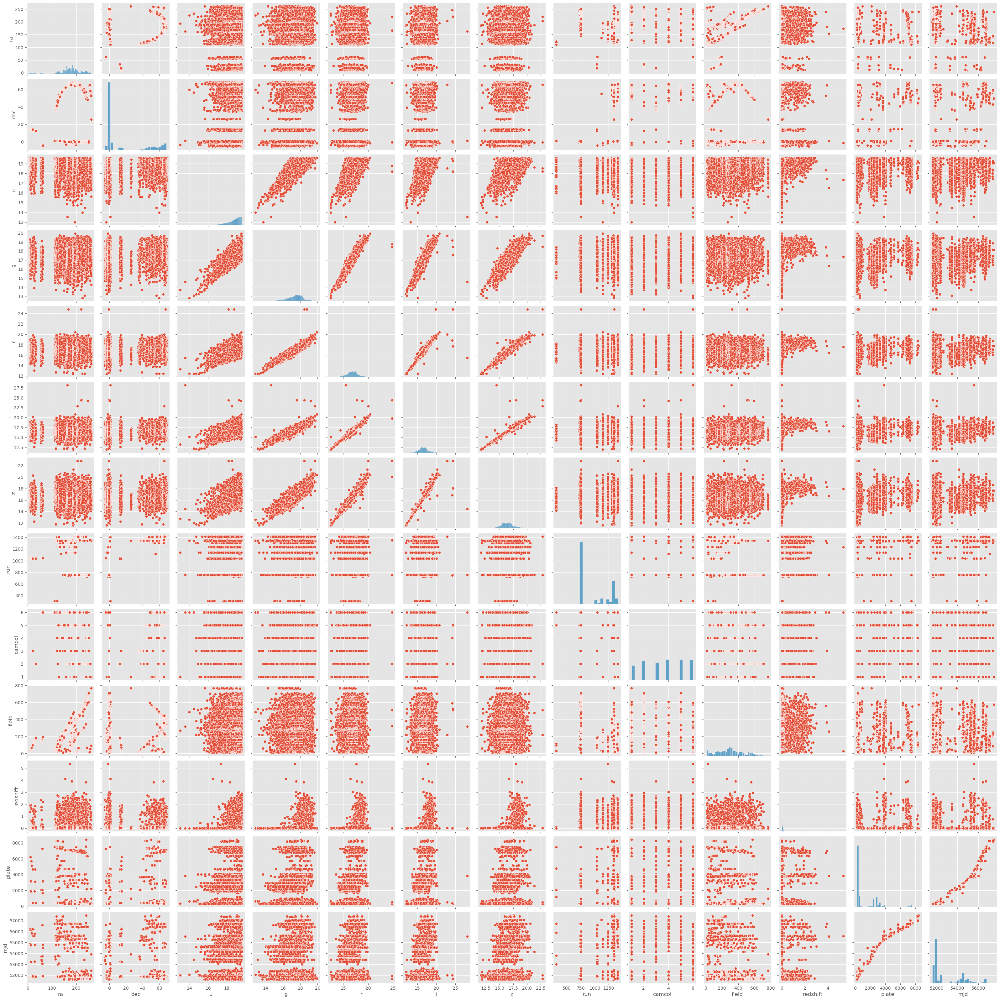

In [400]:
sns.pairplot(X)

### K-Means Plots

Text(0.5, 1.0, 'K-Means')

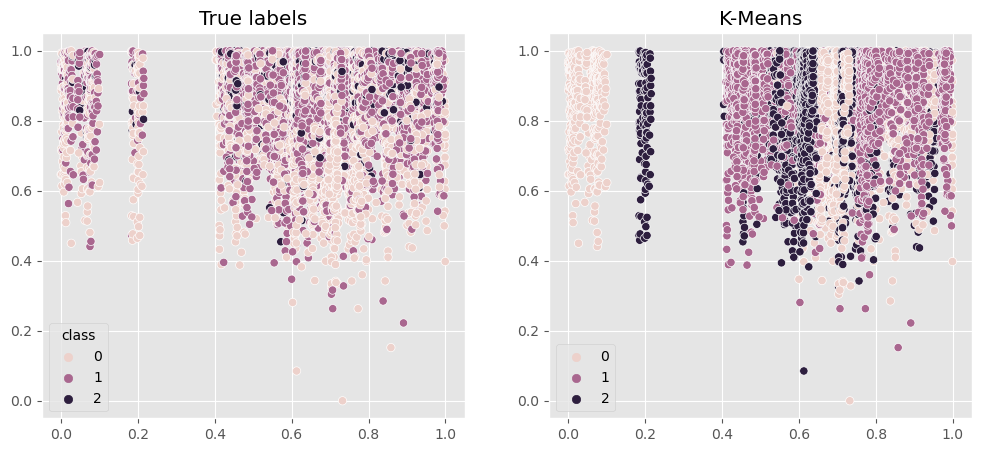

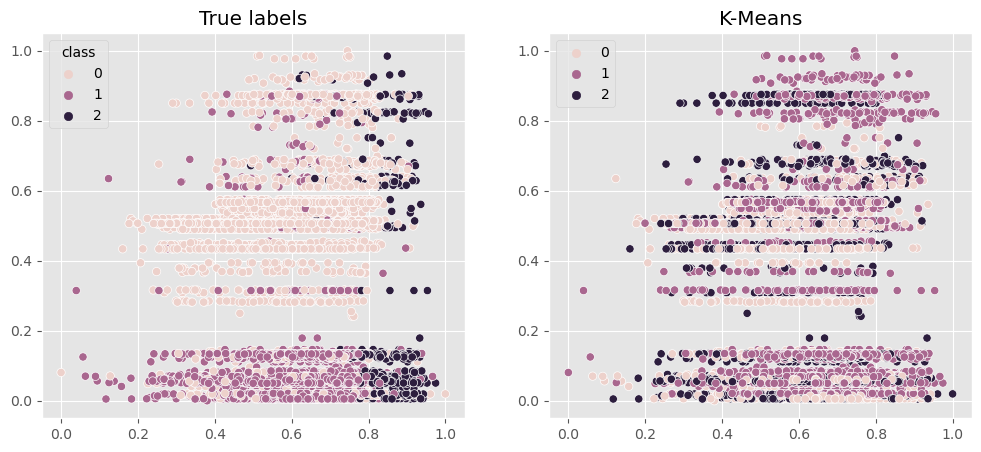

In [401]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=labels_kmeans,ax=ax[1])
ax[1].set_title('K-Means')

f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=labels_kmeans,ax=ax[1])
ax[1].set_title('K-Means')

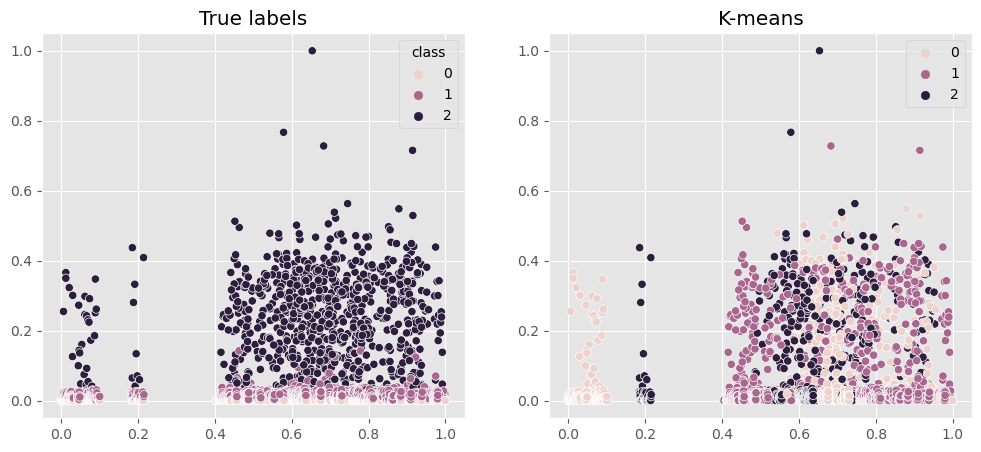

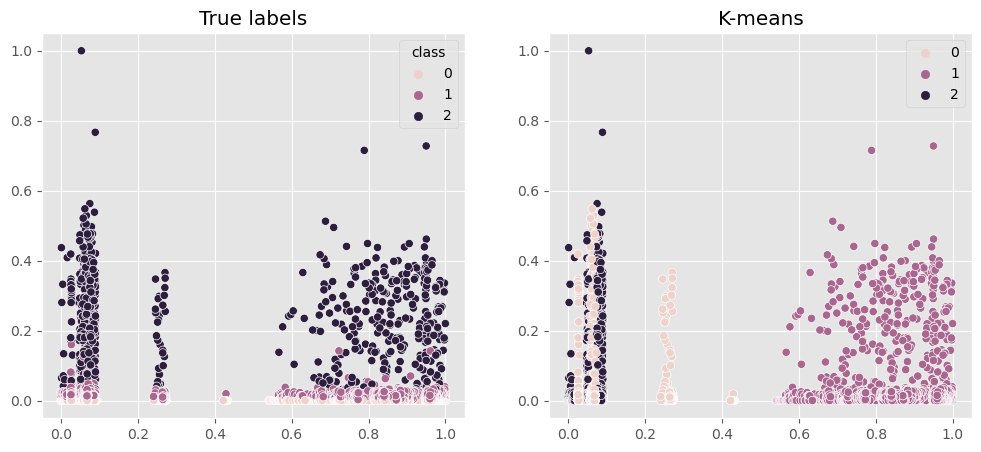

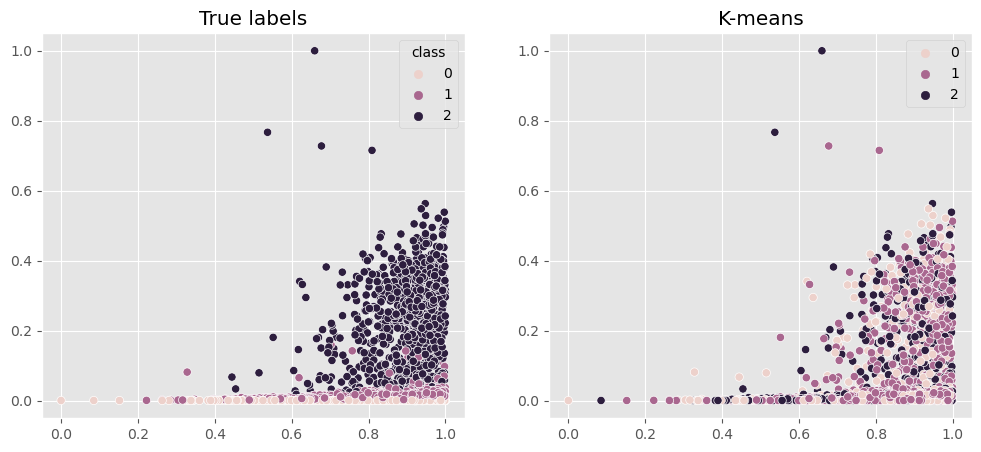

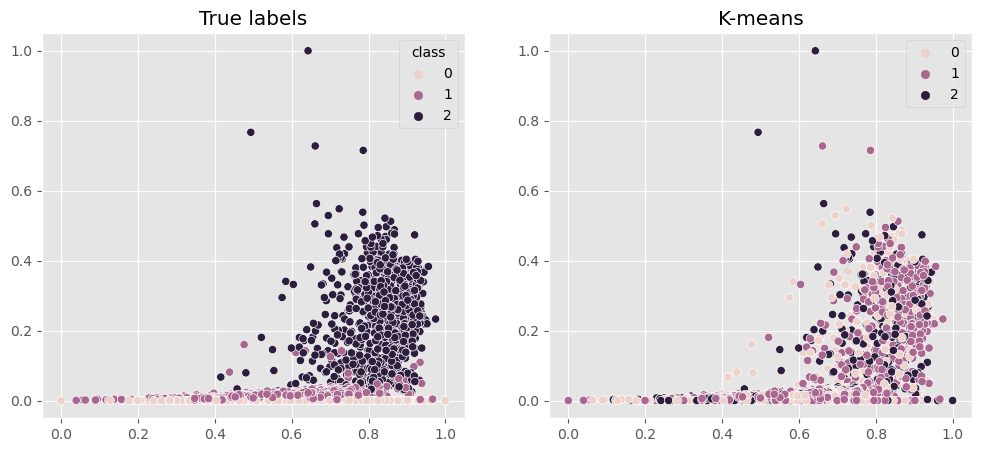

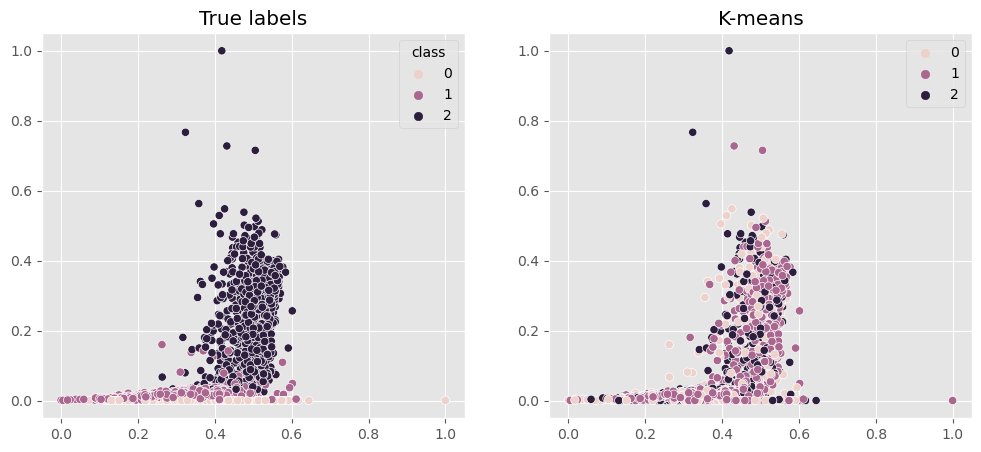

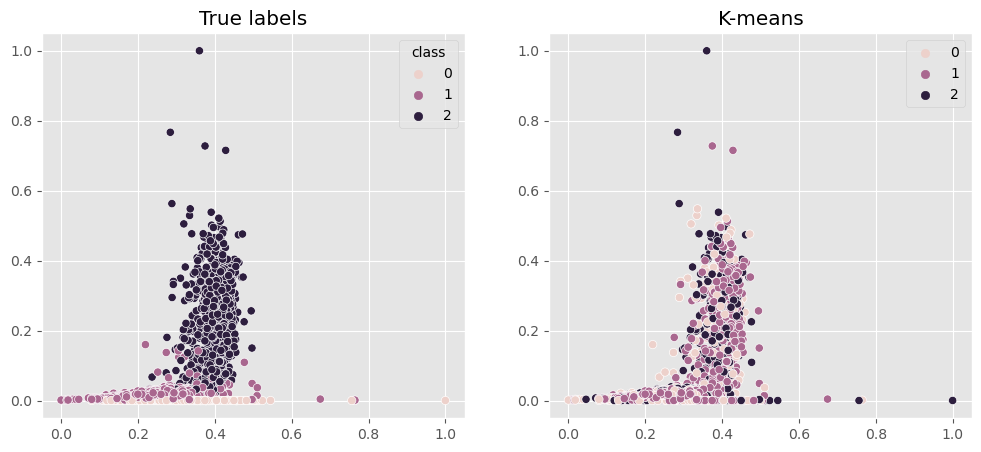

In [402]:
for i in range(0,6):
       
    f,ax=plt.subplots(1,2,figsize=(12,5))
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=y_int,ax=ax[0])
    ax[0].set_title('True labels')
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=labels_kmeans,ax=ax[1])
    ax[1].set_title('K-means')

### Hierarchical Plots

Text(0.5, 1.0, 'Hierarchical')

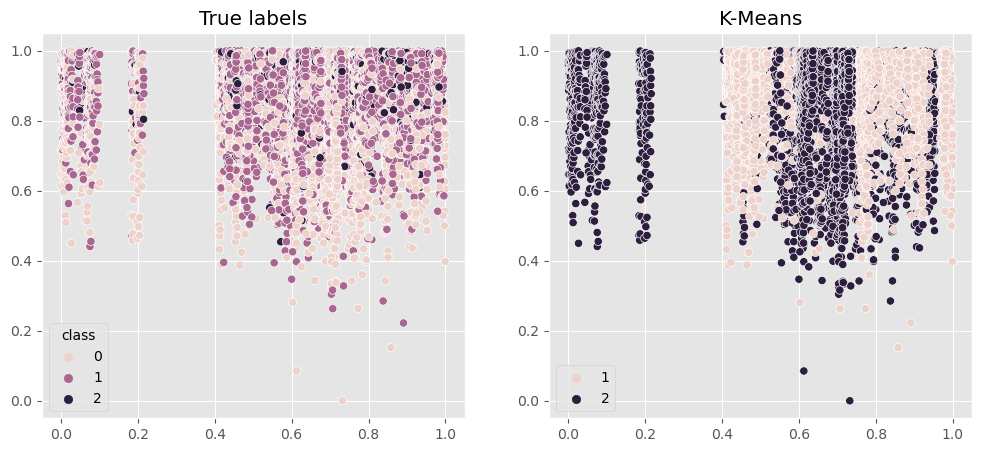

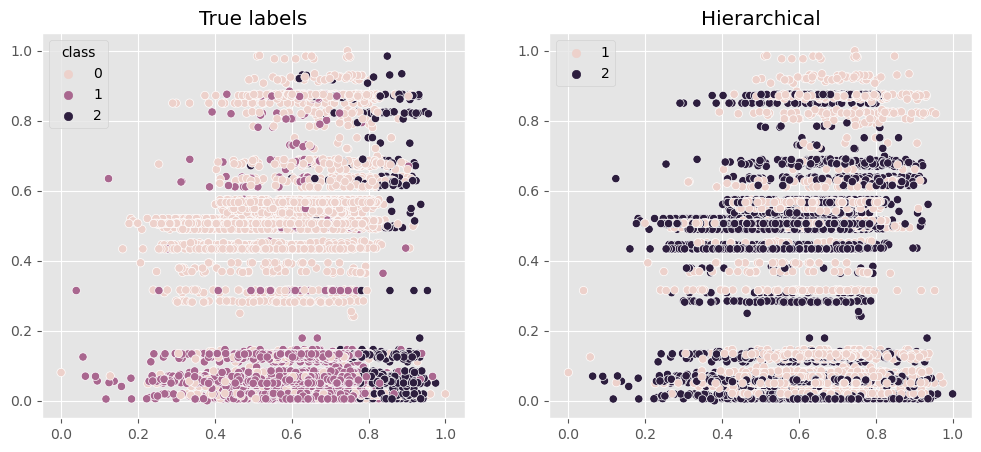

In [403]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=labels_hc,ax=ax[1])
ax[1].set_title('K-Means')

f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=labels_hc,ax=ax[1])
ax[1].set_title('Hierarchical')

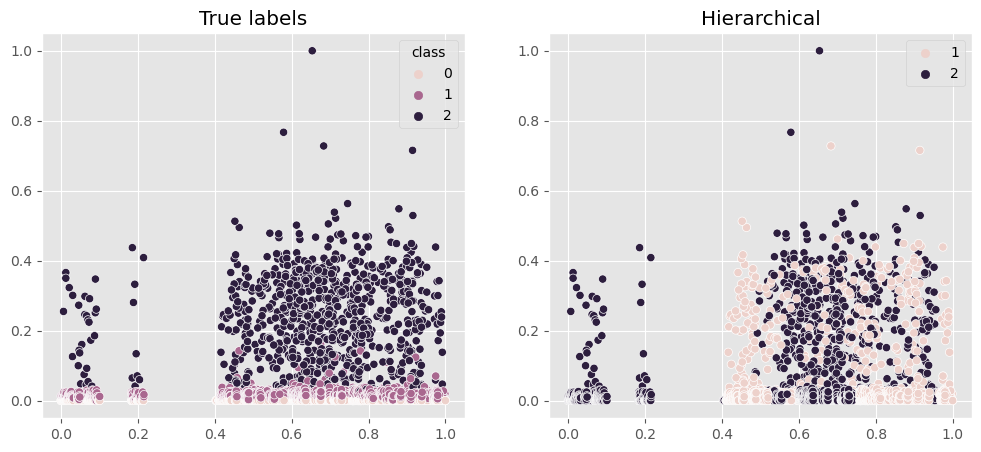

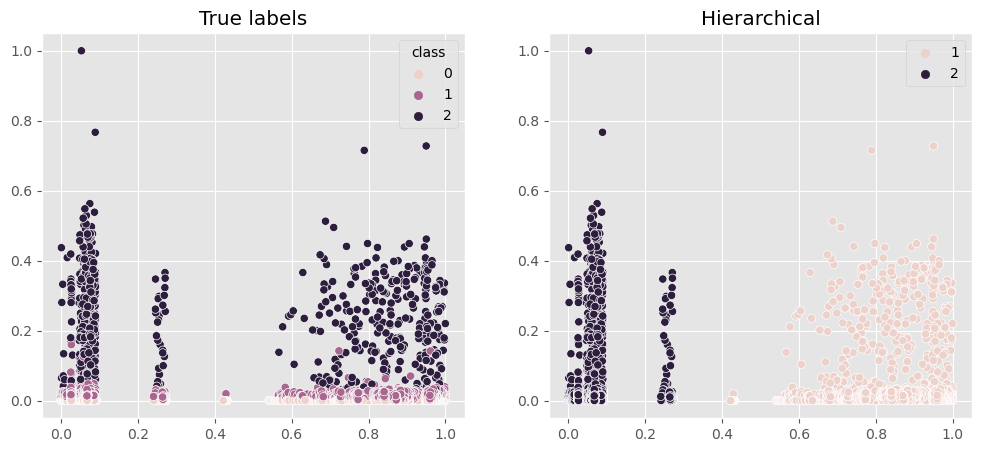

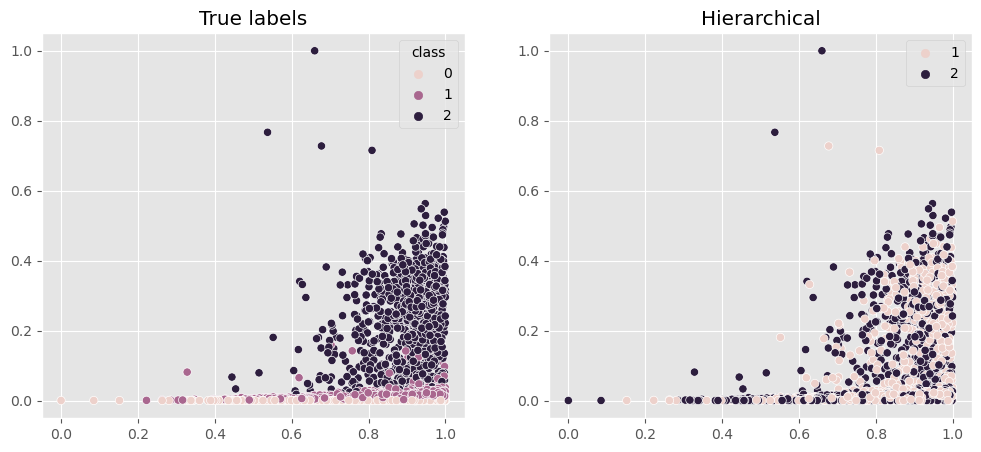

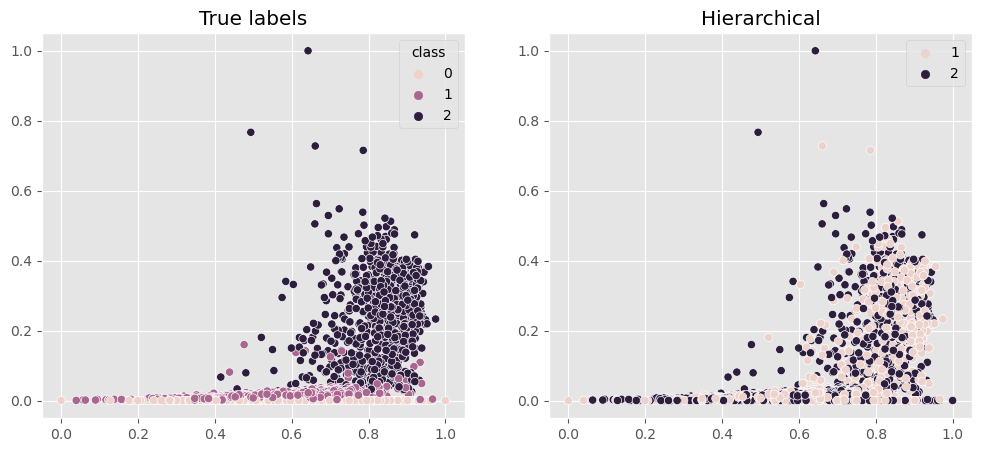

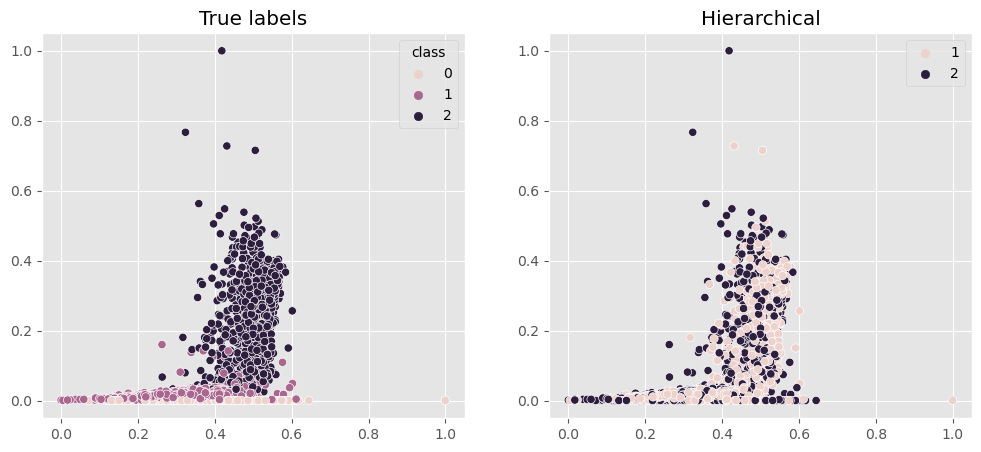

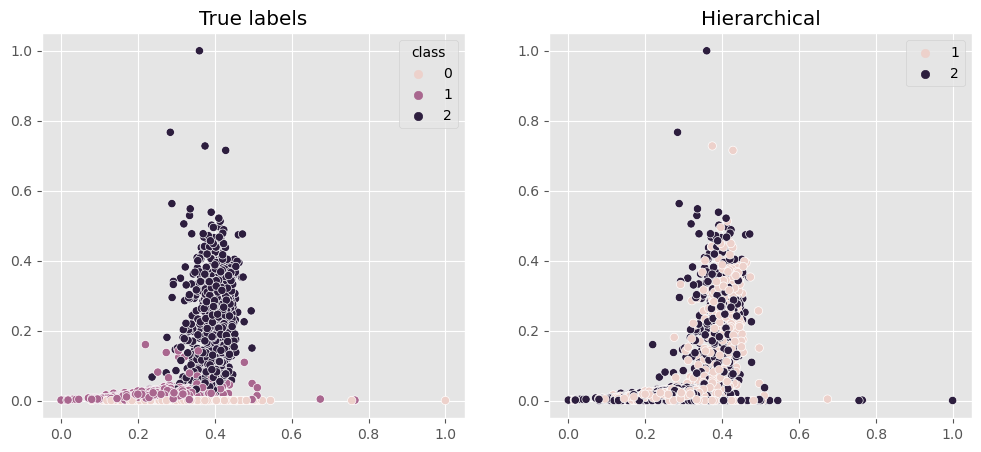

In [404]:
for i in range(0,6):
       
    f,ax=plt.subplots(1,2,figsize=(12,5))
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=y_int,ax=ax[0])
    ax[0].set_title('True labels')
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=labels_hc,ax=ax[1])
    ax[1].set_title('Hierarchical')

### DBSCAN Plots

Text(0.5, 1.0, 'DBSCAN')

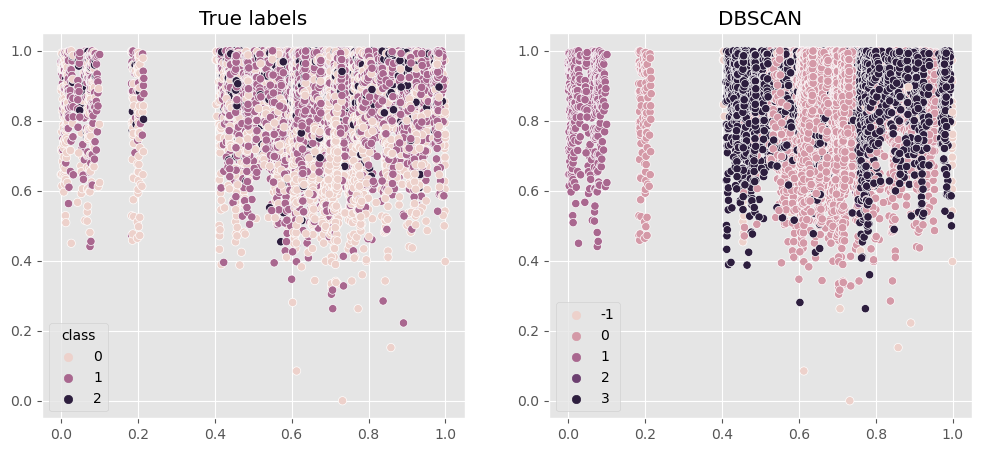

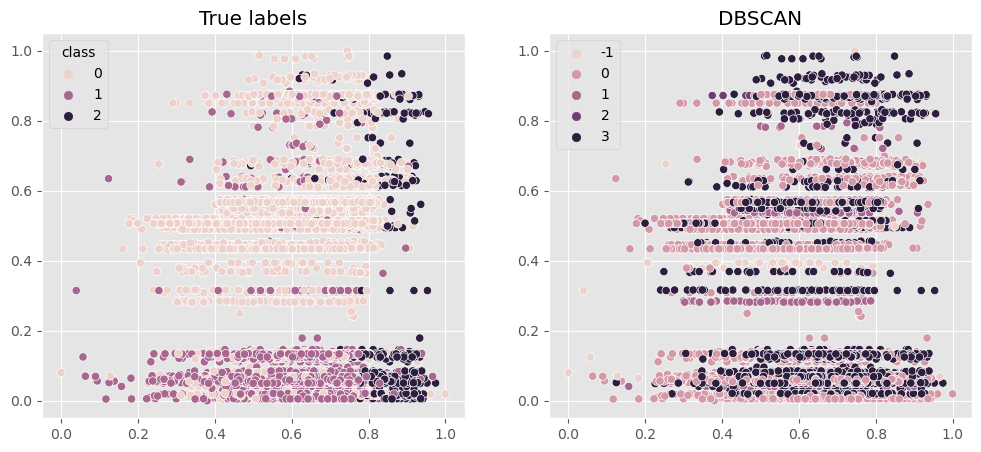

In [405]:
f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,0], y = X_std[:,2],hue=labels_dbscan,ax=ax[1])
ax[1].set_title('DBSCAN')

f,ax=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=y_int,ax=ax[0])
ax[0].set_title('True labels')
sns.scatterplot(x = X_std[:,3], y = X_std[:,12],hue=labels_dbscan,ax=ax[1])
ax[1].set_title('DBSCAN')

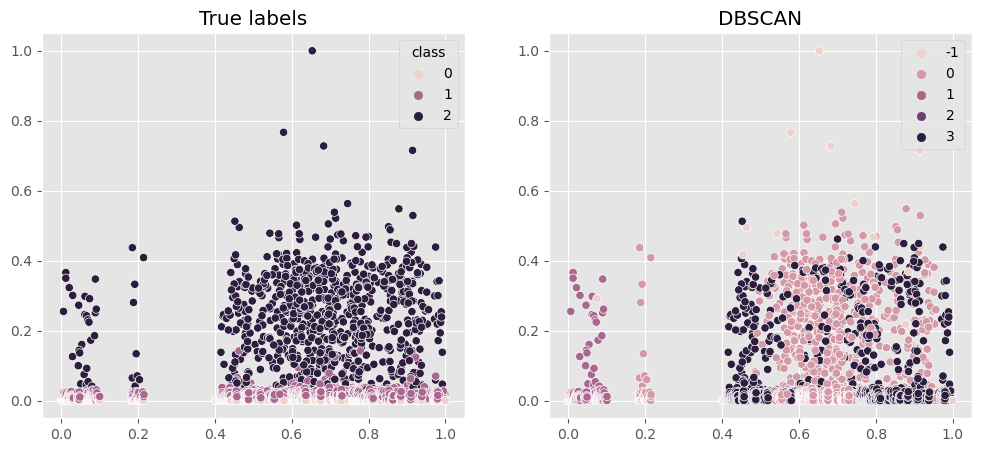

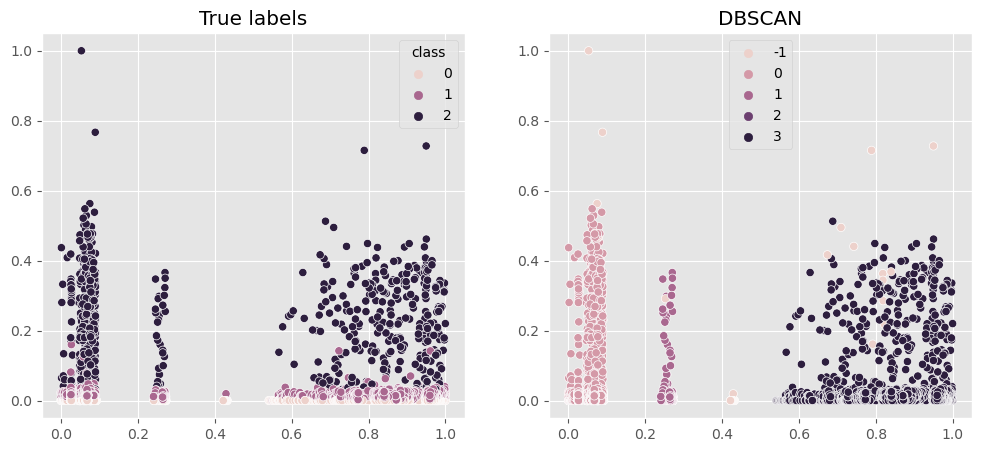

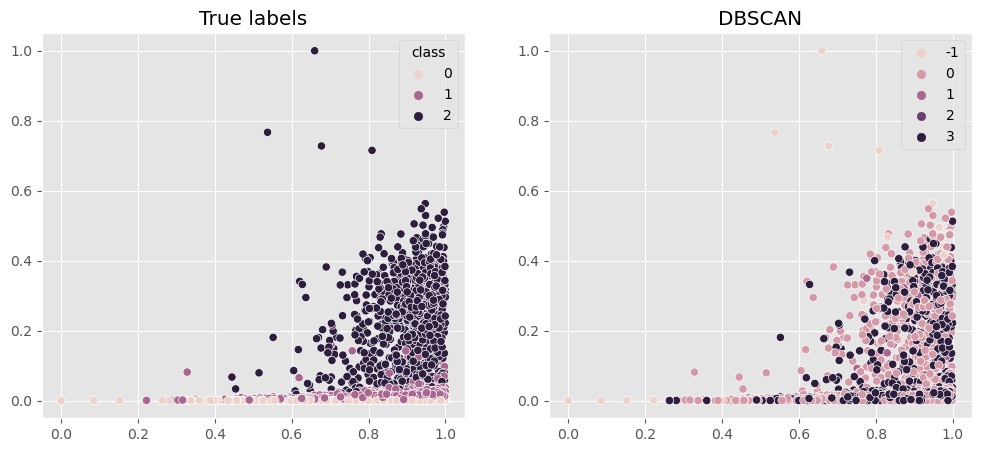

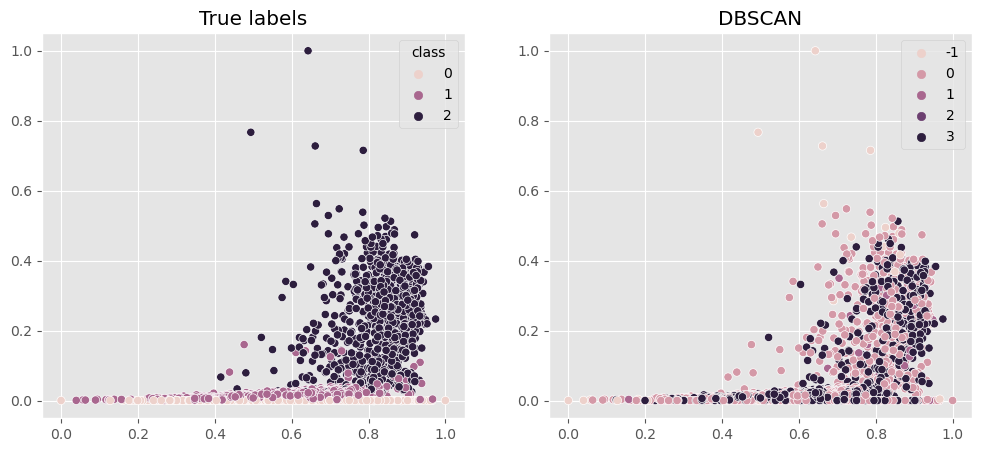

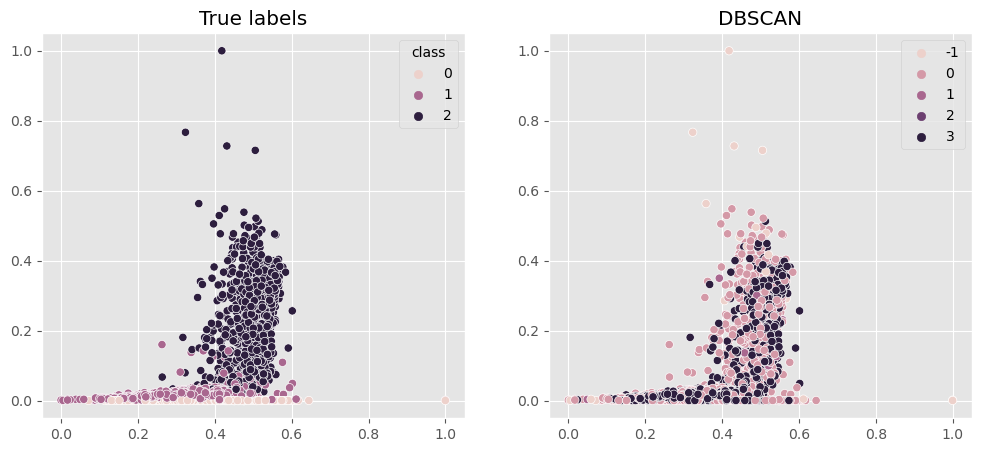

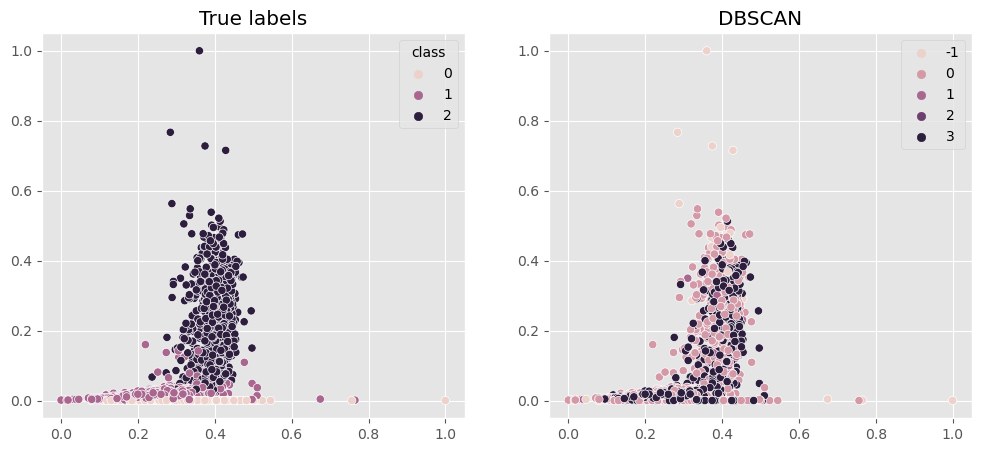

In [406]:
for i in range(0,6):
       
    f,ax=plt.subplots(1,2,figsize=(12,5))
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=y_int,ax=ax[0])
    ax[0].set_title('True labels')
    sns.scatterplot(x = X_std[:,i], y = X_std[:,10],hue=labels_dbscan,ax=ax[1])
    ax[1].set_title('DBSCAN')